# LIBRERIAS

In [111]:
# Importar las librerias

# Ejercicio 1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
# Ejercicio 2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from imblearn.over_sampling import SMOTE
# Ejercicio 3
from sklearn.dummy import DummyClassifier
# Ejercicio 4
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import optuna
from sklearn.model_selection import cross_val_score
# Ejercicio 5
import shap
# Ejercicio 6
from pycaret.classification import setup, compare_models
# Ejercicio 7
from keras.models import Sequential
from keras.layers import Dense
from skopt import gp_minimize
# Ejercicio 9
import joblib




# EJERCICIO 1

1.	Realizar un análisis descriptivo, que ayude a la comprensión del problema, de cada una de las variables involucradas, detallando: características, comportamiento y rango de variación. ¿Qué es cada variable?
Debe incluir (estos ítems no están necesariamente en orden):
●	Análisis y decisión sobre datos faltantes.
●	Visualización de datos (por ejemplo histogramas, scatterplots entre variables, diagramas de caja)
●	¿Está balanceado el dataset? ¿Por qué cree que hacemos esta pregunta?
●	Codificación de variables categóricas (si se van a utilizar para predicción).
●	Matriz de correlación de variables.
●	Estandarización/escalado de datos.
●	Validación cruzada train - test. Realizar una división del conjunto de datos en conjuntos de entrenamiento y prueba (y si se quiere, se puede incluir validación, que luego será útil) en el MOMENTO donde lo crean adecuado.


In [112]:
"""
Carga del dataset y seleccion de ciudades
"""

# Cargar el dataset
df = pd.read_csv('weatherAUS.csv')

# Mostrar las columnas del dataset
print("Columnas dataset", "(Cantidad:" , len(df.columns), "):", df.columns)

# Obtener las ciudades únicas
ciudades_unicas = df['Location'].unique()

# Seleccionar 10 ciudades aleatorias
np.random.seed(42)  # Fijar semilla para reproducibilidad
ciudades_seleccionadas = np.random.choice(ciudades_unicas, size=10, replace=False)

# Filtrar el dataset para quedarnos solo con las ciudades seleccionadas
df_filtrado = df[df['Location'].isin(ciudades_seleccionadas)]

# Mostrar las ciudades seleccionadas
print("Ciudades seleccionadas:", ciudades_seleccionadas)

Columnas dataset (Cantidad: 23 ): Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')
Ciudades seleccionadas: ['Williamtown' 'AliceSprings' 'Katherine' 'Launceston' 'MountGinini'
 'Dartmoor' 'Watsonia' 'Portland' 'Townsville' 'Bendigo']


**DECISIÓN**:

Seleccionamos aleatoriamente 10 ciudades del dataset y filtrado los datos para trabajar solo con estas ubicaciones. Esto reduce el tamaño del dataset y nos permite enfocarnos en un subconjunto manejable.

** SIGNIFICADO DE CADA UNA DE LAS VARIABLES MEDIDAS **

1.  Date: Fecha de la observación, en formato AAAA-MM-DD.

2.	Location: Nombre de la localidad donde se registraron los datos meteorológicos.

3.	MinTemp: Temperatura mínima registrada durante el día (en grados Celsius).

4.	MaxTemp: Temperatura máxima registrada durante el día (en grados Celsius).

5.	Rainfall: Cantidad total de lluvia registrada durante el día (en milímetros).

6.	Evaporation: Cantidad de agua evaporada durante el día (en milímetros).

7.	Sunshine: Cantidad de horas de sol registradas durante el día.

8.	WindGustDir: Dirección del viento durante la ráfaga más fuerte del día, expresada en abreviaturas de puntos cardinales (por ejemplo, W para oeste).

9.	WindGustSpeed: Velocidad máxima del viento durante una ráfaga en el día, medida en km/h.

10.	WindDir9am: Dirección del viento a las 9:00 am, en abreviaturas de puntos cardinales.

11.	WindDir3pm: Dirección del viento a las 3:00 pm, en abreviaturas de puntos cardinales.

12.	WindSpeed9am: Velocidad del viento a las 9:00 am, medida en km/h.

13.	WindSpeed3pm: Velocidad del viento a las 3:00 pm, medida en km/h.

14.	Humidity9am: Humedad relativa registrada a las 9:00 am (en porcentaje).

15.	Humidity3pm: Humedad relativa registrada a las 3:00 pm (en porcentaje).

16.	Pressure9am: Presión atmosférica registrada a las 9:00 am (en hPa - hectopascales).

17.	Pressure3pm: Presión atmosférica registrada a las 3:00 pm (en hPa - hectopascales).

18.	Cloud9am: Cantidad de nubes observada a las 9:00 am (en octavos del cielo cubierto).

19.	Cloud3pm: Cantidad de nubes observada a las 3:00 pm (en octavos del cielo cubierto).

20.	Temp9am: Temperatura registrada a las 9:00 am (en grados Celsius).

21.	Temp3pm: Temperatura registrada a las 3:00 pm (en grados Celsius).

22.	RainToday: Indica si llovió o no durante el día anterior (valores: Yes o No).

23.	RainTomorrow: Indica si llovió o no el día siguiente al de la observación (valores: Yes o No). Esta variable se utiliza frecuentemente como objetivo en modelos predictivos.

Valores faltantes por columna:
Date                 0
Location             0
MinTemp            238
MaxTemp            174
Rainfall           730
Evaporation      10077
Sunshine         14182
WindGustDir        774
WindGustSpeed      771
WindDir9am        2263
WindDir3pm         510
WindSpeed9am       320
WindSpeed3pm       316
Humidity9am        832
Humidity3pm       1409
Pressure9am       4300
Pressure3pm       4297
Cloud9am         10895
Cloud3pm         11650
Temp9am            602
Temp3pm           1111
RainToday          730
RainTomorrow       731
dtype: int64

Porcentaje de valores faltantes por columna:
Date              0.000000
Location          0.000000
MinTemp           0.825987
MaxTemp           0.603873
Rainfall          2.533491
Evaporation      34.972583
Sunshine         49.219130
WindGustDir       2.686194
WindGustSpeed     2.675783
WindDir9am        7.853821
WindDir3pm        1.769973
WindSpeed9am      1.110571
WindSpeed3pm      1.096689
Humidity9am       2.887485
Hum

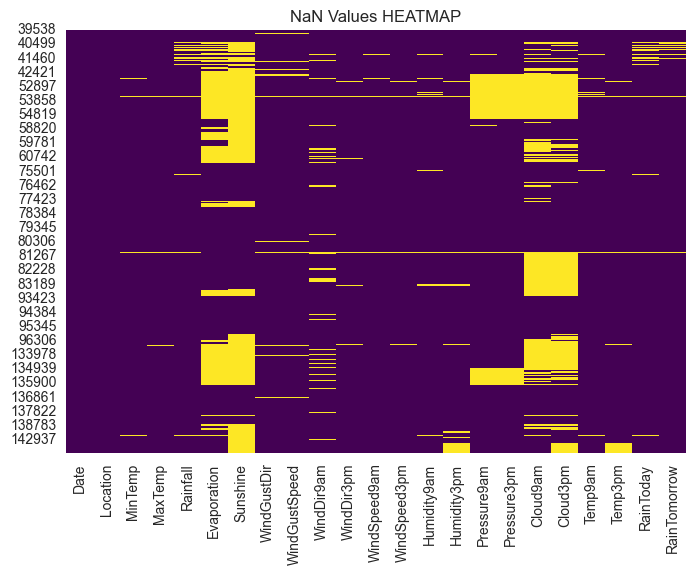

In [113]:
"""
Análisis de Datos Faltantes
"""

# Verificar valores faltantes por columna
valores_faltantes = df_filtrado.isnull().sum()

# Calcular el porcentaje de valores faltantes
porcentaje_faltantes = (valores_faltantes / len(df_filtrado)) * 100

# Mostrar el resultado
print("Valores faltantes por columna:")
print(valores_faltantes)
print("\nPorcentaje de valores faltantes por columna:")
print(porcentaje_faltantes)

# Mostrar mapa de calor de valores faltantes
sns.heatmap(df_filtrado.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

**DECISIÓN:**

Hemos identificado la cantidad y el porcentaje de valores faltantes en cada columna. Lo cual es consistente en el heatmap, donde las columnas poseen una alta densidad de color amarillo. Dependiendo del porcentaje, decidiremos si imputar o eliminar los valores faltantes. Por ejemplo, si una columna tiene más del 30% de valores faltantes, podríamos considerar eliminarla. 

Las columnas con un valor de datos faltantes mayor al 30% son:
- Evaporation
- Sunshine
- Cloud9am
- Cloud3pm

Sin embargo, no las eliminaremos a las columnas porque mas adelante en el analisis se aprecia que estas variables son significativas con respecto a la variable objetivo.

Tambien, debemos eliminar las filas donde RainTomorrow sea igual a un valor NaN, ya que esto no nos permitiria entrenar el modelo.

En nuestro modelo, las ciudades se seleccionan al azar. Si entrenamos el modelo considerando la variable «Location», no tendría sentido inferir en una ciudad donde no se entrenó. Por lo tanto, también debemos eliminar la columna «Location».

También tenemos la variable «Date», que contiene la fecha exacta (año, mes y día), que no es relevante, pero al convertirla a mes, podemos ignorar los años y mantener el modelo funcional con el paso del tiempo. Además, generamos una variable Mes más significativa que el día exacto.

Conservamos el nombre de la columna como Date, pero tiene un nuevo significado, simplemente sera el Mes.


Columnas dataset (Cantidad: 22 ): Index(['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


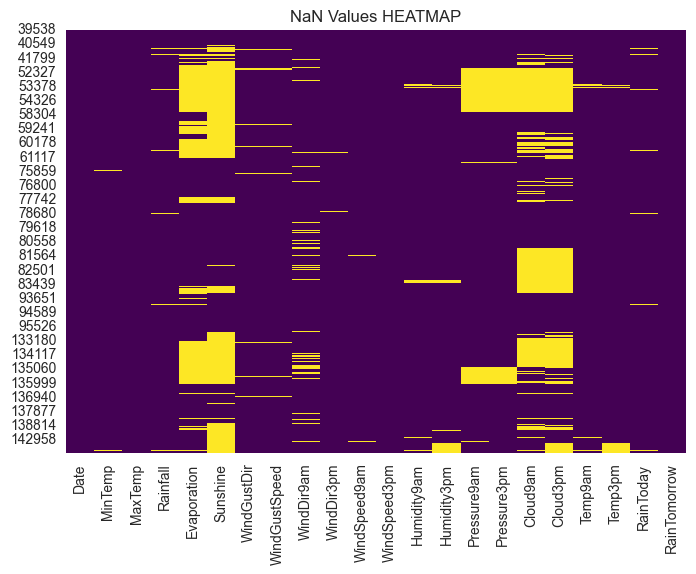

In [114]:
"""
Depurado de acuerdo a la decision anterior
"""
# Eliminar filas donde RainTomorrow es nulo
df_depurado = df_filtrado.dropna(subset=['RainTomorrow'])

# Eliminar columnas donde el porcentaje de nulos es mayor al 30%
df_depurado = df_depurado.drop(['Location'], axis=1)
print("Columnas dataset", "(Cantidad:" , len(df_depurado.columns), "):", df_depurado.columns)

# Convertir Date de una columna que contiene los dias a contener solamente los meses
df_depurado['Date'] = pd.to_datetime(df_depurado['Date'])
df_depurado['Date'] = df_depurado['Date'].dt.month

# Mostrar heatmap de valores faltantes en el dataset depurado 
sns.heatmap(df_depurado.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

In [115]:
df_depurado

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
39538,1,15.2,34.0,0.0,11.6,9.2,NW,41.0,WNW,SE,...,62.0,36.0,1005.2,1001.5,3.0,6.0,23.7,28.7,No,No
39539,1,18.3,24.5,0.0,8.8,9.4,S,54.0,S,E,...,61.0,57.0,1012.1,1011.7,3.0,2.0,21.6,23.4,No,No
39540,1,16.8,23.5,0.4,8.4,0.4,NE,37.0,ESE,ENE,...,60.0,58.0,1020.4,1018.4,7.0,7.0,20.1,21.7,No,No
39541,1,17.5,27.8,0.0,5.0,12.0,E,50.0,NE,ENE,...,60.0,51.0,1018.4,1014.6,1.0,1.0,22.7,26.4,No,No
39542,1,14.8,36.0,0.0,8.6,11.9,ENE,37.0,NNW,ENE,...,67.0,39.0,1013.6,1008.7,2.0,3.0,22.5,33.8,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143875,6,12.4,32.0,0.0,6.4,NaN,SE,41.0,SE,E,...,56.0,NaN,1016.6,1012.3,0.0,NaN,20.3,NaN,No,No
143876,6,15.0,32.0,0.0,9.6,NaN,E,35.0,SE,ESE,...,47.0,NaN,1015.9,1012.1,0.0,NaN,21.8,NaN,No,No
143877,6,15.4,31.5,0.0,3.6,NaN,ESE,43.0,ESE,ESE,...,70.0,NaN,1016.6,1012.7,0.0,NaN,21.6,NaN,No,No
143878,6,12.2,31.5,0.0,4.0,NaN,ESE,37.0,SE,ESE,...,45.0,NaN,1017.1,1012.8,0.0,NaN,19.9,NaN,No,No


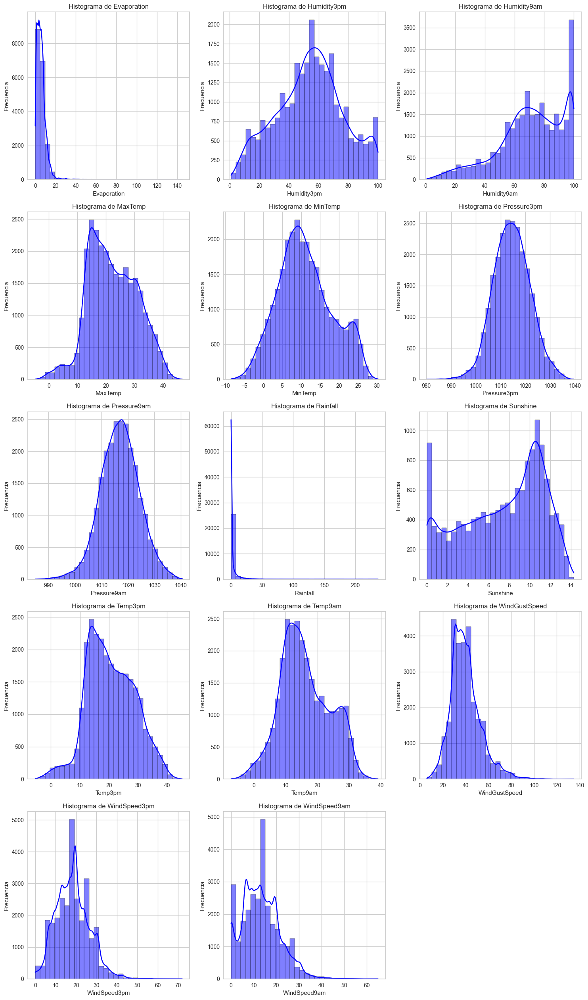

In [116]:
"""
Histogramas de las variables numericas
"""
# Seleccionar solo las columnas numéricas
columnas_numericas = df_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])
# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_numericas) + 1) // 2, ncols=3, figsize=(15, 5 * ((len(columnas_numericas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar histogramas para cada columna numérica usando Seaborn
for i, col in enumerate(columnas_numericas):
    sns.histplot(df_depurado[col], ax=axes[i], kde=True, color='blue', bins=30)
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**APRECIACIÓN:**

Las variables numericas que tenemos, tienen la mayoria distribuciones campanulares tipicas. 

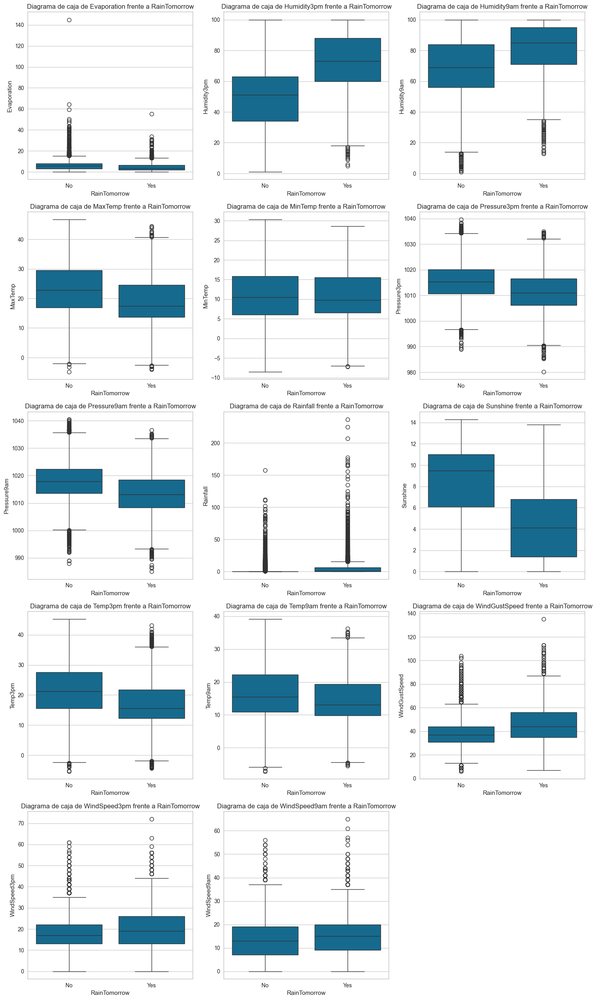

In [117]:
"""
Graficos de las variables numericas frente a variable objetivo RainTomorrow
"""

# Seleccionar solo las columnas numéricas
columnas_numericas = df_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_numericas) + 1) // 2, ncols=3, figsize=(15, 5 * ((len(columnas_numericas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar diagramas de caja para cada columna numérica frente a RainTomorrow usando Seaborn
for i, col in enumerate(columnas_numericas):
    sns.boxplot(x='RainTomorrow', y=col, data=df_depurado, ax=axes[i])
    axes[i].set_title(f'Diagrama de caja de {col} frente a RainTomorrow')
    axes[i].set_xlabel('RainTomorrow')
    axes[i].set_ylabel(col)

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**APRECIACIÓN:**

Lo que podemos analizar en la grafica anterior, es el cambio de distribuciones cuando una variable posee que RainTomorrow es NO o SI.

Podemos ver como Humidity3pm Genera un cambio de distribucion significativo cuando RainTomorrow es positivo, es decir que es una variable que tiene una alta significacion en RainTomorrow.

Rainfall tambien es una variable que tiene un cambio de distribucion significativo cuando RainTomorrow es SI.

Variables como MinTemp por ejemplo, no cambia su distribucion con respecto a RainTomorrow, lo que nos indicaria que no debe ser una variable significativa.

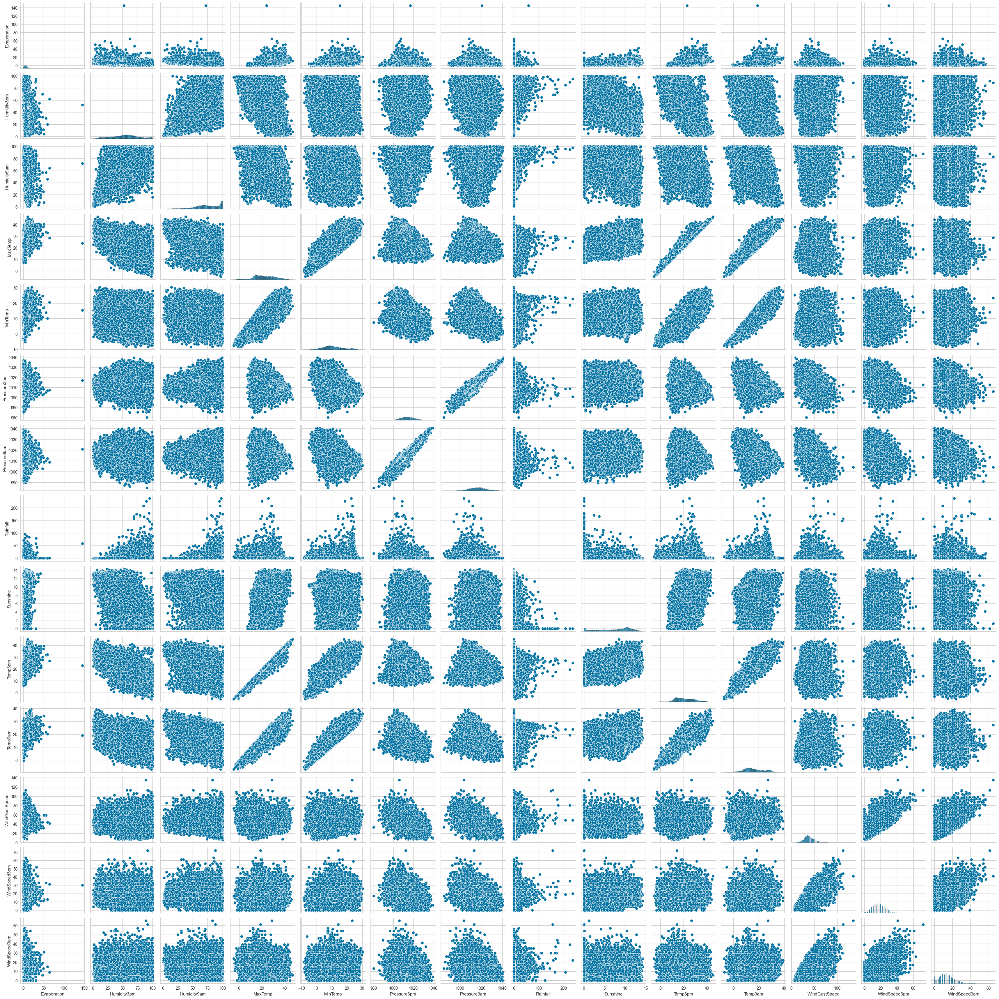

In [118]:
# Seleccionar solo las columnas numéricas
columnas_numericas = df_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Crear un DataFrame con las columnas numéricas y la columna objetivo
df_numericas = df_depurado[columnas_numericas]
df_numericas['RainTomorrow'] = df_depurado['RainTomorrow']

# Generar el pairplot
sns.pairplot(df_numericas)

# Mostrar la figura
plt.show()


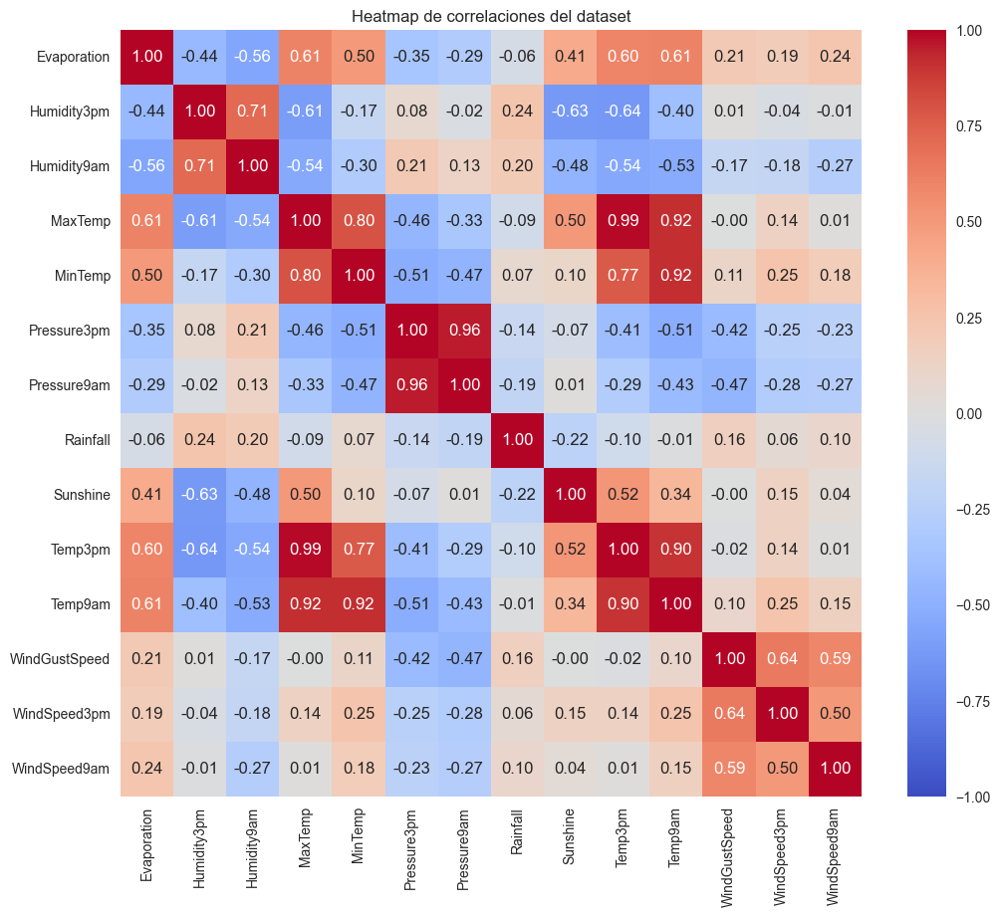

In [119]:
# Seleccionar solo las columnas numéricas
columnas_numericas = df_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Calcular la matriz de correlación
matriz_correlacion = df_depurado[columnas_numericas].corr()

# Generar el heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_correlacion, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)

# Título para el heatmap
plt.title('Heatmap de correlaciones del dataset')
plt.show()


**APRECIACION**

Podemos ver como la mayoria de las variables no tienen una dependencia entre si significativa.

Mientras que existen variables que tienen dependencias lineales que resultan significativas. Esto se puede ver en el Heatmap.

El heatmap nos da informacion sobre las dependiencias lineales, al igual que el pairplot, sin embargo el pairplot nos da tambien idea de otros tipos de dependencias, que en este caso no encontramos ningun otro tipo de dependencia que se pueda apreciar que no sea lineal.

Valores que tenemos en cuenta para que haya correlacion en el heatmap,
0 nos indica que no hay correlacion lineal.
Entre 0 y 0.4, hay correlacion lineal baja
Entre 0.4 y 0.7 hay correlacion lineal moderada
Entre 0.7 y 1 hay correlacion lineal alta
Una correlacion lineal de 1 nos indica correlacion lineal perfecta.

El signo nos indica si la correlacion es positiva o negativa.

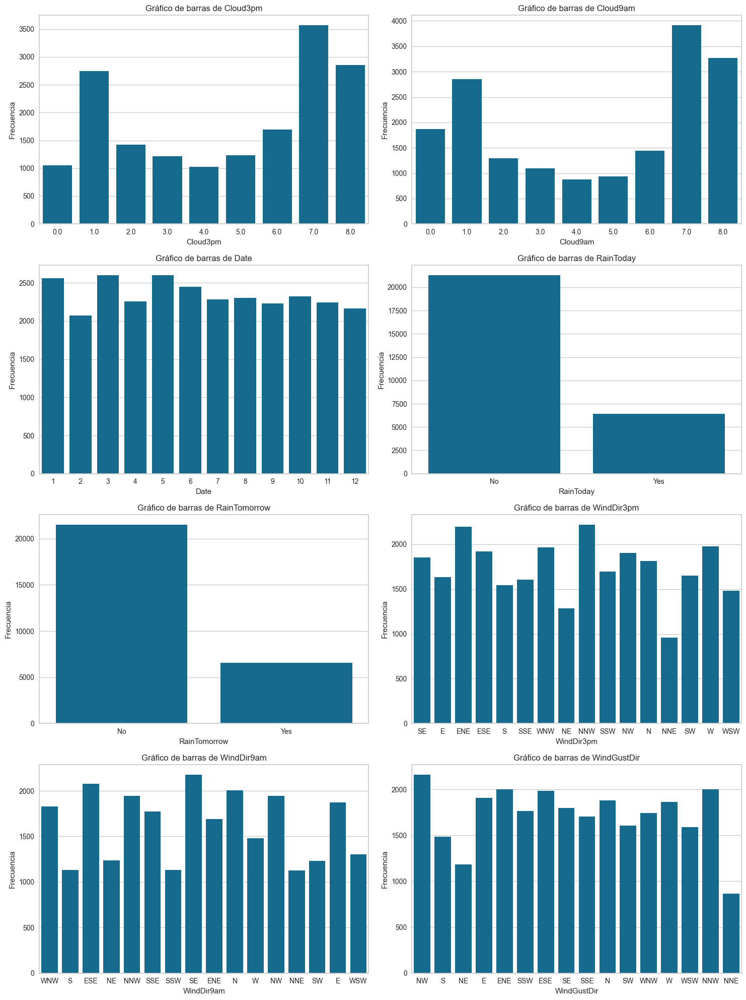

In [120]:
"""
Graficos de barra de las variables categoricas
"""

# Seleccionar solo las columnas categóricas
columnas_categoricas = df_depurado.select_dtypes(include=['object', 'category', 'int32']).columns.union(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_categoricas) + 1) // 2, ncols=2, figsize=(15, 5 * ((len(columnas_categoricas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar gráficos de barras para cada columna categórica usando Seaborn
for i, col in enumerate(columnas_categoricas):
    sns.countplot(x=col, data=df_depurado, ax=axes[i])
    axes[i].set_title(f'Gráfico de barras de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()


**APRECIACIÓN:**

Las variables categoricas que tenemos, tienen frecuencias similares para cualquier direccion. 

Lo que podemos resaltar es que RainToday, y RainTomorrow, tienen una frecuencia significativamente mayor de NO, que de SI

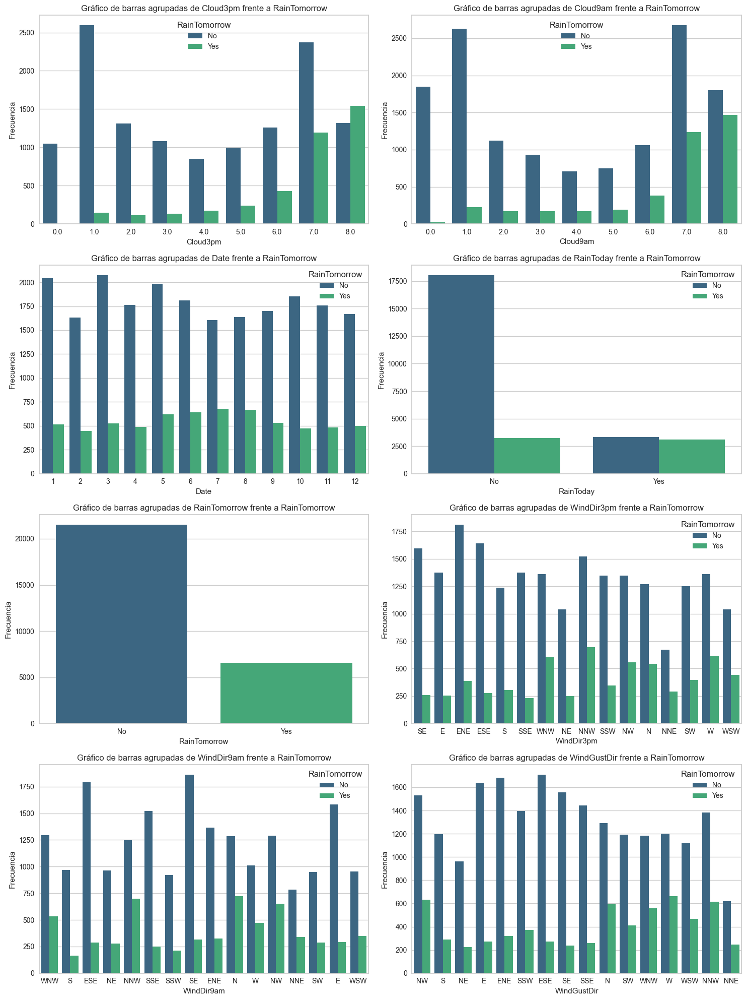

In [121]:
""" 
Graficos de las variables categoricas frente a variable objetivo RainTomorrow
"""
# Seleccionar solo las columnas categóricas
columnas_categoricas = df_depurado.select_dtypes(include=['object', 'category', 'int32']).columns.union(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_categoricas) + 1) // 2, ncols=2, figsize=(15, 5 * ((len(columnas_categoricas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar gráficos de barras agrupadas para cada columna categórica frente a RainTomorrow usando Seaborn
for i, col in enumerate(columnas_categoricas):
    sns.countplot(x=col, hue='RainTomorrow', data=df_depurado, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Gráfico de barras agrupadas de {col} frente a RainTomorrow')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()


**APRECIACIÓN:**

Podemos ver en las graficas que ninguna categorizacion en las primeras 3 graficas, favorece la Lluvia al dia siguiente sobre la no lluvia.

En el caso de RainToday, teniendo en cuenta RainTomorrow. 

Es interesante analizar como, las frecuencias de RainTomorrow condicionadas a RainToday, resultan similares a ser un 50/50. 

Es importante ver la tendencia de la grafica de Date, podemos ver como entre los meses 5 y 9, aumenta la proporcion de RainTomorrow como SI. Esto es coherente teniendo en cuenta que entre Mayo y Septiembre, nos encontramos en temporada de Invierno en Australia, el cual se caracteriza por tener una mayor proporcion de Lluvia con respecto a otras estaciones. 

Se puede apreciar claramente como Cloud9am y Cloud3pm son variables que a medida que aumentan, la frecuencia de RainTomorrow esta en aumento.

Balance de la variable 'RainTomorrow':
RainTomorrow
No     76.62999
Yes    23.37001
Name: proportion, dtype: float64


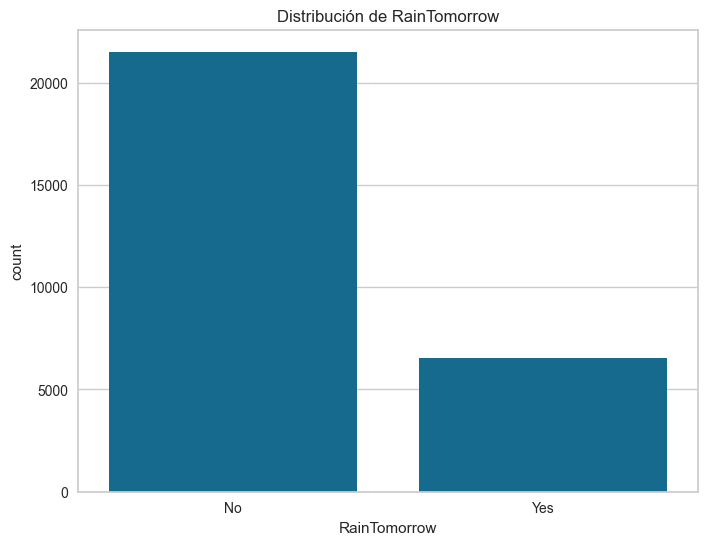

In [122]:
# Verificar el balance de la variable objetivo
balance = df_depurado['RainTomorrow'].value_counts(normalize=True) * 100
print("Balance de la variable 'RainTomorrow':")
print(balance)

# Gráfico de barras para visualizar el balance
plt.figure(figsize=(8, 6))
sns.countplot(x='RainTomorrow', data=df_depurado)
plt.title('Distribución de RainTomorrow')
plt.show()

**APRECIACIÓN:**

Vemos que la relacion NO/SI de RainTomorrow es de 77 a 23. Lo que nos estaria indicando que el dataset esta Desbalanceado.

Que este desbalanceado puede afectar el rendimiento del modelo. Para esto podriamos considerar realizar Undersampling o Oversampling, y asi mejorar el modelo.

**DECISION**

Decidimos codificar las variables categoricas de RainToday y RainTomorrow en 0 y 1
A su vez decidimos codificar las variables categoricas de Direcciones cardinales en angulos, y descomponerlos en sus componentes en X y en Y, a partir del seno-coseno.

In [123]:
"""
 Codificacion de variables categoricas
"""
cardinal_to_angle = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5,
}

# Reemplazar los puntos cardinales por sus respectivos angulos
df_depurado['WindGustDir'] = df_depurado['WindGustDir'].replace(cardinal_to_angle)
df_depurado['WindDir9am'] = df_depurado['WindDir9am'].replace(cardinal_to_angle)
df_depurado['WindDir3pm'] = df_depurado['WindDir3pm'].replace(cardinal_to_angle)

# Calcular las coordenadas seno y coseno para la variable 'WindGustDir'.
df_depurado['WindGustDir_Sen'] = np.sin(df_depurado['WindGustDir'])
df_depurado['WindGustDir_Cos'] = np.cos(df_depurado['WindGustDir'])

# Calcular las coordenadas seno y coseno para la variable 'WindDir9am'.
df_depurado['WindDir9am_Sen'] = np.sin(df_depurado['WindDir9am'])
df_depurado['WindDir9am_Cos'] = np.cos(df_depurado['WindDir9am'])

# Calcular las coordenadas seno y coseno para la variable 'WindDir3pm'.
df_depurado['WindDir3pm_Sen'] = np.sin(df_depurado['WindDir3pm'])
df_depurado['WindDir3pm_Cos'] = np.cos(df_depurado['WindDir3pm'])

# Eliminar las variables originales 'WindGustDir', 'WindDir9am' y 'WindDir3pm', ya que no serán necesarias para el entrenamiento del modelo.
df_depurado = df_depurado.drop(columns=['WindGustDir'])
df_depurado = df_depurado.drop(columns=['WindDir9am'])
df_depurado = df_depurado.drop(columns=['WindDir3pm'])

# Convertir las variables RainToday y RainTomorrow en variables de valor 0 para No llovio y 1 para Llovio.
df_depurado[['RainToday','RainTomorrow']] = df_depurado[['RainToday','RainTomorrow']].replace({'No': 0, 'Yes': 1})

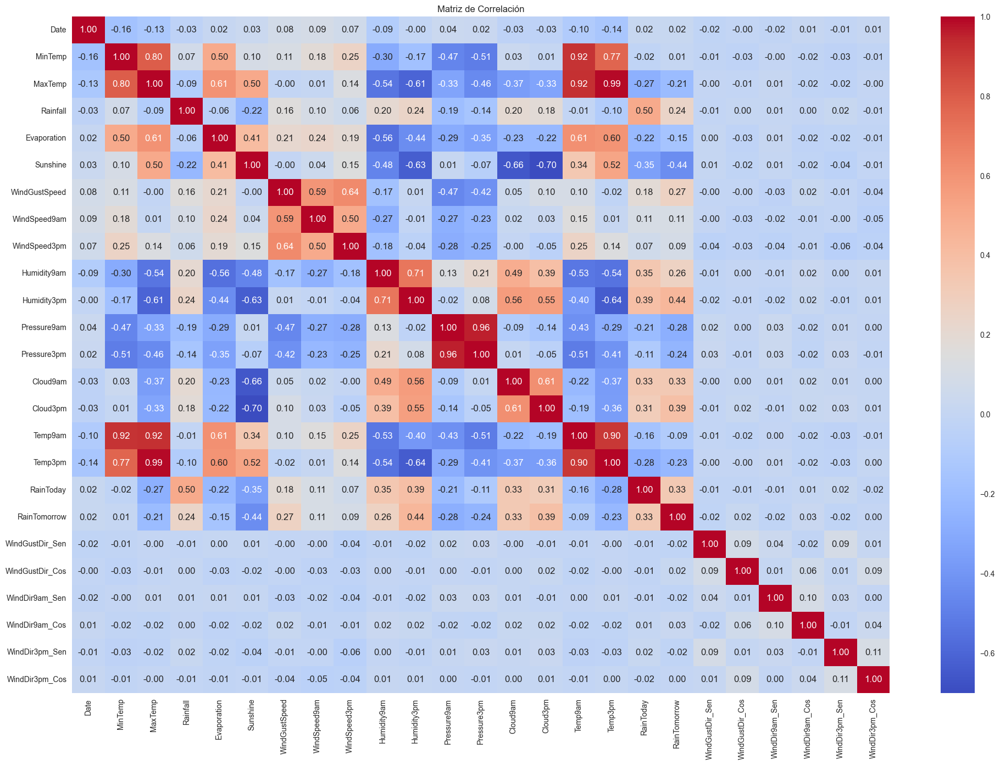

In [124]:
""" 
Matriz de correlacion aumentada con las variables categoricas.
"""

# Calcular la matriz de correlación
corr_matrix = df_depurado.corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(24, 16))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlación')
plt.show()


**APRECIACION**
En la matriz de correlacion ampliada, no notamos cambios significativos con respecto a lo analizado previamente, si podemos apreciar dependiencias lineales de variables con RainTomorrow, sin embargo ninguna mayor a 0.5.

In [125]:
""" 
Separacion en TRAIN-TEST
"""

# Separar las columnas del dataset en dos conjuntos de caracteristicas 'X' y una clase a predecir 'y'
X = df_depurado.drop('RainTomorrow', axis=1)
y = df_depurado['RainTomorrow']

# Dividir conjunto de datos en TRAIN TEST, 80% de entrenamiento y 20% de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos los conjuntos de entrenamiento y prueba a DataFrames para mantener la estructura del dataset original.
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

In [126]:
def mixed_method(X_train, X_test, columns_mean, columns_median, columns_mode, columns_knn):
    # Imputación de valores faltantes utilizando un "MÉTODO MIXTO".
    # Se realiza imputación estadística (SimpleImputer) para algunas columnas y KNNImputer para otras.
    
    # Creación de imputadores para diferentes estrategias.
    imputer_mean = SimpleImputer(strategy='mean')
    imputer_median = SimpleImputer(strategy='median')
    imputer_mode = SimpleImputer(strategy='most_frequent')
    imputer_knn = KNNImputer(n_neighbors=5)
    
    # Creación de un ColumnTransformer para aplicar diferentes estrategias de imputación por columna.
    preprocessor = ColumnTransformer(
        transformers=[
            ('mean', imputer_mean, columns_mean),
            ('median', imputer_median, columns_median),
            ('mode', imputer_mode, columns_mode),
            ('knn', imputer_knn, columns_knn)
        ],
        remainder='passthrough'
    )
    
    # Creación de un pipeline que incluye el preprocesador y el escalado de los datos.
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('scaler', StandardScaler())
    ])
    
    # Aplicación del pipeline a los datos de entrenamiento y prueba.
    X_train_scaled = pipeline.fit_transform(X_train)
    X_test_scaled = pipeline.transform(X_test)
    
    # Retornar los datos preprocesados, escalados y el pipeline completo.
    return X_train_scaled, X_test_scaled, pipeline

In [127]:
# Hemos seleccionado un método de imputación de valores faltantes específico para cada columna,
# basado en las distribuciones observadas en las gráficas:
# - Para distribuciones más gaussianas, aplicamos la **media**.
# - Para columnas con datos concentrados en un rango muy pequeño, aplicamos la **moda**.
# - Para columnas con sesgos hacia alguno de los extremos, aplicamos la **mediana**.
# - Para el resto de las columnas, utilizamos el método de imputación de **K vecinos**,
#   para que el valor a imputar tenga en cuenta los valores de los vecinos.

mean= ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

mode = [ 'Rainfall','Sunshine', 'WindSpeed9am']

median = ['Humidity9am','Humidity3pm', 'Evaporation', 'WindSpeed3pm']

knn = ['Cloud9am', 'Cloud3pm','RainToday', 'WindGustDir_Sen', 'WindGustDir_Cos',
       'WindDir9am_Sen', 'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos']

# Aplicamos el método mixto de imputación y escalado.
X_train_scaled , X_test_scaled , pipeline = mixed_method(X_train,X_test,mean,median,mode,knn)

# Salvar pipeline para inferencia
joblib.dump(pipeline, 'docker/preprocess.pkl')


# Preparamos los datos escalados para realizar gráficos con SHAP.
X_train_scaled_shap = X_train_scaled
X_test_scaled_shap = X_test_scaled


# Convertimos los datos escalados en DataFrames con las mismas columnas originales,
# para realizar la regresión logística u otros análisis posteriores.
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)


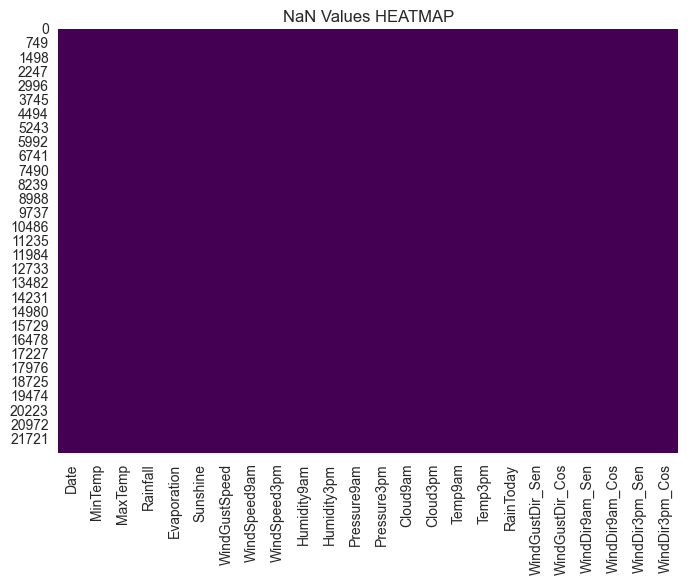

In [128]:
# Corroboramos que no hay valores faltantes en nuestro dataset de entrenamiento ya escalado.
sns.heatmap(X_train_scaled.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

## RESUMEN EJERCICIO 1:

- Se cargo el dataframe a trabajar
- Se elegieron 10 ciudades de manera aleatoria
- NO se eliminaron columnas con un alto porcentajes de datos faltantes ya que estas podian poseer una alta correlacion con la variable a predecir
- Se realizaron los estudios estadisticos pertinentes a las caracteristicas que se mantuvieron
- Se codificaron las variables categoricas
- Se dividio el dataframe en train-test
- Se imputaron los valores faltantes
- Se escalaron los datos de entrenamiento
- Se encontro que el dataframe se encuentra DESBALANCEADO

# EJERCICIO 2

2.	Implementar la solución del problema de clasificación con regresión logística.

●	Obtener las métricas adecuadas (accuracy, precision, recall, F1 score, entre otras, ¡investiguen adicionales!). Graficar matrices de confusión para cada modelo. Analizar “falsos negativos” y “falsos positivos”, ¿qué significa cada uno?

●	Trazar curvas ROC para cada modelo. Comenten cuáles serían los umbrales adecuados a utilizar; ¿cómo podrían calcular el mejor umbral? ¿Es 0.5 el mejor?

●	¿Creen que han conseguido un buen fitting?


## Modelo logistico binario

In [129]:
# Inicializamos el modelo de regresión logística
log_reg = LogisticRegression(max_iter=1000, random_state=42)

# Entrenamos el modelo con los datos escalados
log_reg.fit(X_train_scaled, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [130]:
# Realizamos predicciones en el conjunto de prueba
y_pred = log_reg.predict(X_test_scaled)
y_pred_proba = log_reg.predict_proba(X_test_scaled)[:, 1]  # Probabilidades para la clase positiva

# Calculamos las métricas
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

Accuracy: 0.8403
Precision: 0.7228
Recall: 0.5156
F1-Score: 0.6019
ROC-AUC: 0.8731


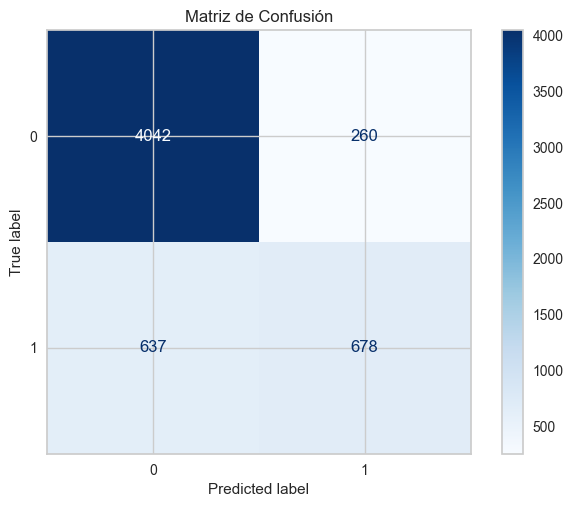

In [131]:
# Graficamos la matriz de confusión
ConfusionMatrixDisplay.from_estimator(log_reg, X_test_scaled, y_test, cmap='Blues')
plt.title("Matriz de Confusión")
plt.show()

X - Y

0 - 0 : True negative(Izquierda Arriba)

0 - 1 : False Negative(Izquierda Abajo)

1 - 0 : False Positive(Derecha Arriba)

1 - 1 : True positives(Derecha Abajo) 

In [132]:
# Extraemos los valores de la matriz de confusión
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print(f"Falsos Positivos (FP): {fp}")
print(f"Falsos Negativos (FN): {fn}")

Falsos Positivos (FP): 260
Falsos Negativos (FN): 637


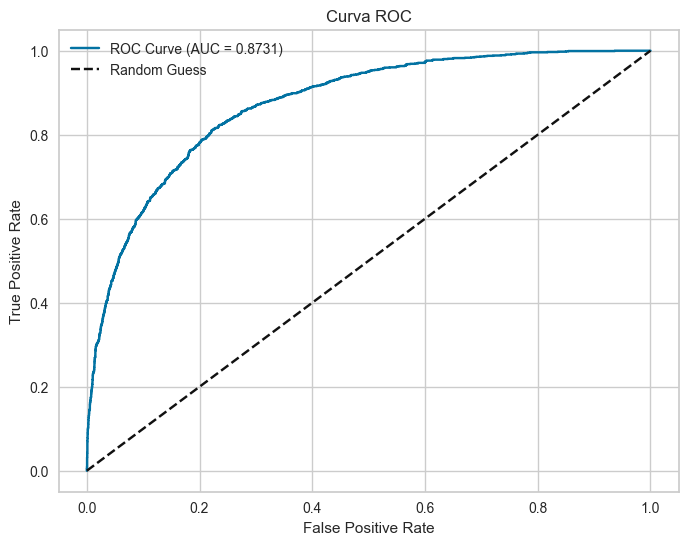

In [133]:
# Calculamos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

In [134]:
# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print(f"Mejor umbral: {optimal_threshold:.4f}")

Mejor umbral: 0.2187


In [135]:
# Aplicamos el nuevo umbral
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

# Recalculamos las métricas con el nuevo umbral
accuracy_optimal = accuracy_score(y_test, y_pred_optimal)
precision_optimal = precision_score(y_test, y_pred_optimal)
recall_optimal = recall_score(y_test, y_pred_optimal)
f1_optimal = f1_score(y_test, y_pred_optimal)

print(f"Accuracy (Umbral Óptimo): {accuracy_optimal:.4f}")
print(f"Precision (Umbral Óptimo): {precision_optimal:.4f}")
print(f"Recall (Umbral Óptimo): {recall_optimal:.4f}")
print(f"F1-Score (Umbral Óptimo): {f1_optimal:.4f}")

Accuracy (Umbral Óptimo): 0.7864
Precision (Umbral Óptimo): 0.5285
Recall (Umbral Óptimo): 0.8099
F1-Score (Umbral Óptimo): 0.6396


## Modelo logistico con muestreo balanceado

Modelo Balanceado - Accuracy: 0.7933
Modelo Balanceado - Precision: 0.5402
Modelo Balanceado - Recall: 0.7863
Modelo Balanceado - F1-Score: 0.6404
Modelo Balanceado - ROC-AUC: 0.8729


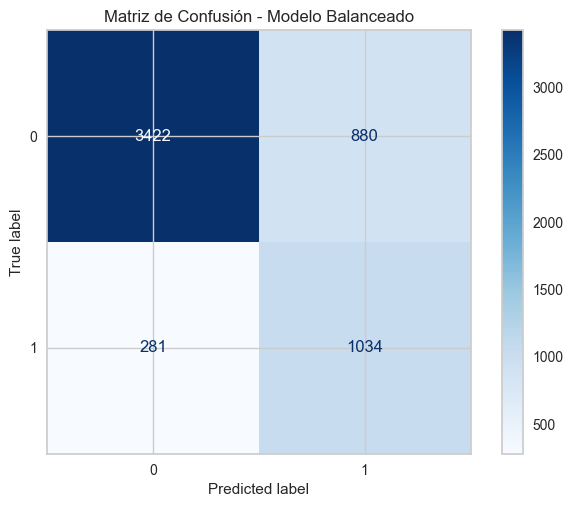

In [136]:
# Modelo de regresión logística con muestreo balanceado
log_reg_balanced = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

# Entrenamos el modelo
log_reg_balanced.fit(X_train_scaled, y_train)

# Realizamos predicciones
y_pred_balanced = log_reg_balanced.predict(X_test_scaled)
y_pred_proba_balanced = log_reg_balanced.predict_proba(X_test_scaled)[:, 1]

# Evaluamos el modelo
accuracy_balanced = accuracy_score(y_test, y_pred_balanced)
precision_balanced = precision_score(y_test, y_pred_balanced)
recall_balanced = recall_score(y_test, y_pred_balanced)
f1_balanced = f1_score(y_test, y_pred_balanced)
roc_auc_balanced = roc_auc_score(y_test, y_pred_proba_balanced)

print(f"Modelo Balanceado - Accuracy: {accuracy_balanced:.4f}")
print(f"Modelo Balanceado - Precision: {precision_balanced:.4f}")
print(f"Modelo Balanceado - Recall: {recall_balanced:.4f}")
print(f"Modelo Balanceado - F1-Score: {f1_balanced:.4f}")
print(f"Modelo Balanceado - ROC-AUC: {roc_auc_balanced:.4f}")

# Matriz de confusión
ConfusionMatrixDisplay.from_estimator(log_reg_balanced, X_test_scaled, y_test, cmap='Blues')
plt.title("Matriz de Confusión - Modelo Balanceado")
plt.show()

In [137]:
# Calculamos la curva ROC para el modelo balanceado
fpr_balanced, tpr_balanced, thresholds_balanced = roc_curve(y_test, y_pred_proba_balanced)

# Encontramos el umbral óptimo
optimal_idx_balanced = np.argmax(tpr_balanced - fpr_balanced)
optimal_threshold_balanced = thresholds_balanced[optimal_idx_balanced]

print(f"Umbral óptimo para el modelo balanceado: {optimal_threshold_balanced:.4f}")

Umbral óptimo para el modelo balanceado: 0.4674


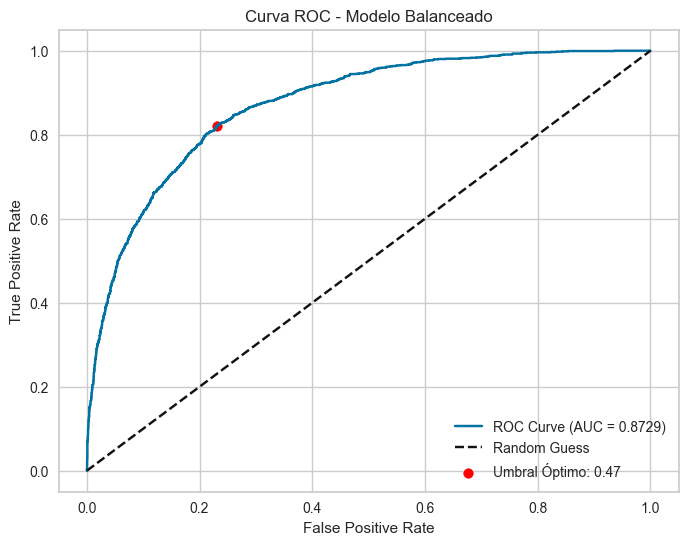

In [138]:
# Calculamos la curva ROC para el modelo balanceado
fpr_balanced, tpr_balanced, thresholds_balanced = roc_curve(y_test, y_pred_proba_balanced)

# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_balanced, tpr_balanced, label=f"ROC Curve (AUC = {roc_auc_balanced:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_balanced[optimal_idx_balanced], tpr_balanced[optimal_idx_balanced], color='red', label=f"Umbral Óptimo: {optimal_threshold_balanced:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Modelo Balanceado")
plt.legend()
plt.show()

In [139]:
# Aplicamos el umbral óptimo
y_pred_balanced_optimal = (y_pred_proba_balanced >= optimal_threshold_balanced).astype(int)

# Evaluamos el modelo con el nuevo umbral
accuracy_balanced_optimal = accuracy_score(y_test, y_pred_balanced_optimal)
precision_balanced_optimal = precision_score(y_test, y_pred_balanced_optimal)
recall_balanced_optimal = recall_score(y_test, y_pred_balanced_optimal)
f1_balanced_optimal = f1_score(y_test, y_pred_balanced_optimal)

print(f"Modelo Balanceado (Umbral Óptimo) - Accuracy: {accuracy_balanced_optimal:.4f}")
print(f"Modelo Balanceado (Umbral Óptimo) - Precision: {precision_balanced_optimal:.4f}")
print(f"Modelo Balanceado (Umbral Óptimo) - Recall: {recall_balanced_optimal:.4f}")
print(f"Modelo Balanceado (Umbral Óptimo) - F1-Score: {f1_balanced_optimal:.4f}")

Modelo Balanceado (Umbral Óptimo) - Accuracy: 0.7817
Modelo Balanceado (Umbral Óptimo) - Precision: 0.5215
Modelo Balanceado (Umbral Óptimo) - Recall: 0.8213
Modelo Balanceado (Umbral Óptimo) - F1-Score: 0.6379


## Modelo con Oversampling

Distribución de clases antes del oversampling: RainTomorrow
0    17218
1     5248
Name: count, dtype: int64
Distribución de clases después del oversampling: RainTomorrow
1    17218
0    17218
Name: count, dtype: int64
Modelo con SMOTE - Accuracy: 0.7938
Modelo con SMOTE - Precision: 0.5411
Modelo con SMOTE - Recall: 0.7863
Modelo con SMOTE - F1-Score: 0.6410
Modelo con SMOTE - ROC-AUC: 0.8729


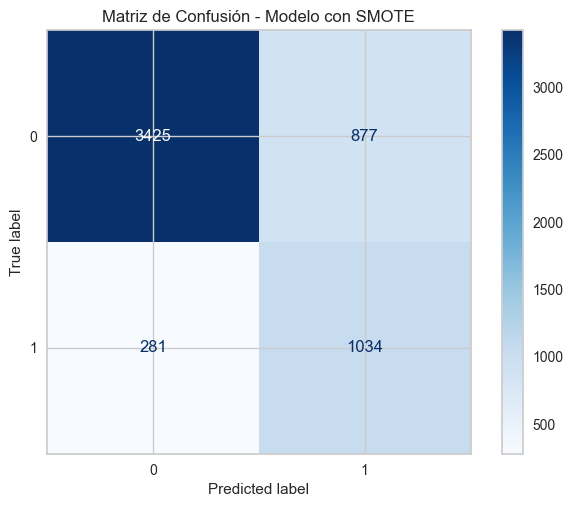

In [140]:
# Aplicamos SMOTE para balancear el dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Verificamos el balance después del oversampling
print(f"Distribución de clases antes del oversampling: {y_train.value_counts()}")
print(f"Distribución de clases después del oversampling: {pd.Series(y_train_smote).value_counts()}")

# Entrenamos el modelo con los datos balanceados
log_reg_smote = LogisticRegression(max_iter=1000, random_state=42)
log_reg_smote.fit(X_train_smote, y_train_smote)

# Realizamos predicciones
y_pred_smote = log_reg_smote.predict(X_test_scaled)
y_pred_proba_smote = log_reg_smote.predict_proba(X_test_scaled)[:, 1]

# Evaluamos el modelo
accuracy_smote = accuracy_score(y_test, y_pred_smote)
precision_smote = precision_score(y_test, y_pred_smote)
recall_smote = recall_score(y_test, y_pred_smote)
f1_smote = f1_score(y_test, y_pred_smote)
roc_auc_smote = roc_auc_score(y_test, y_pred_proba_smote)

print(f"Modelo con SMOTE - Accuracy: {accuracy_smote:.4f}")
print(f"Modelo con SMOTE - Precision: {precision_smote:.4f}")
print(f"Modelo con SMOTE - Recall: {recall_smote:.4f}")
print(f"Modelo con SMOTE - F1-Score: {f1_smote:.4f}")
print(f"Modelo con SMOTE - ROC-AUC: {roc_auc_smote:.4f}")

# Matriz de confusión
ConfusionMatrixDisplay.from_estimator(log_reg_smote, X_test_scaled, y_test, cmap='Blues')
plt.title("Matriz de Confusión - Modelo con SMOTE")
plt.show()

In [141]:
# Calculamos la curva ROC para el modelo con SMOTE
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)

# Encontramos el umbral óptimo
optimal_idx_smote = np.argmax(tpr_smote - fpr_smote)
optimal_threshold_smote = thresholds_smote[optimal_idx_smote]

print(f"Umbral óptimo para el modelo con SMOTE: {optimal_threshold_smote:.4f}")

Umbral óptimo para el modelo con SMOTE: 0.4226


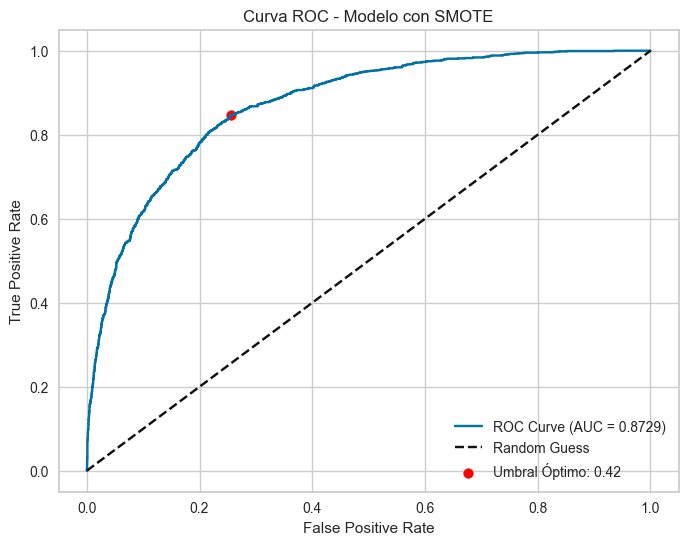

In [142]:
# Calculamos la curva ROC para el modelo con SMOTE
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)

# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_smote, tpr_smote, label=f"ROC Curve (AUC = {roc_auc_smote:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_smote[optimal_idx_smote], tpr_smote[optimal_idx_smote], color='red', label=f"Umbral Óptimo: {optimal_threshold_smote:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Modelo con SMOTE")
plt.legend()
plt.show()

In [143]:
# Aplicamos el umbral óptimo
y_pred_smote_optimal = (y_pred_proba_smote >= optimal_threshold_smote).astype(int)

# Evaluamos el modelo con el nuevo umbral
accuracy_smote_optimal = accuracy_score(y_test, y_pred_smote_optimal)
precision_smote_optimal = precision_score(y_test, y_pred_smote_optimal)
recall_smote_optimal = recall_score(y_test, y_pred_smote_optimal)
f1_smote_optimal = f1_score(y_test, y_pred_smote_optimal)

print(f"Modelo con SMOTE (Umbral Óptimo) - Accuracy: {accuracy_smote_optimal:.4f}")
print(f"Modelo con SMOTE (Umbral Óptimo) - Precision: {precision_smote_optimal:.4f}")
print(f"Modelo con SMOTE (Umbral Óptimo) - Recall: {recall_smote_optimal:.4f}")
print(f"Modelo con SMOTE (Umbral Óptimo) - F1-Score: {f1_smote_optimal:.4f}")

Modelo con SMOTE (Umbral Óptimo) - Accuracy: 0.7678
Modelo con SMOTE (Umbral Óptimo) - Precision: 0.5025
Modelo con SMOTE (Umbral Óptimo) - Recall: 0.8471
Modelo con SMOTE (Umbral Óptimo) - F1-Score: 0.6308


## RESUMEN EJERCICIO 2:

- Se realizaron tres regresiones logisticas por defecto y en su umbral optimo cada una.
- El modelo más basico fue la regresion logistica binaria que arrojo f1-score de 0.6046
- El umbral optimo de la RLB fue de aproximadamente 0.2 y su f1-score en este 0.6346
- La regresion logistica con muestreo balanceado obtuvo un f1-score de 0.6385
- Su umbral optimo fue de 0.4799 y obtuvo en este un f1-score de 0.6387
- El metodo de Oversampling o SMOTE, obtuvo un f1-score de 0.6374
- Su umbral optimo fue de 0.4704 y en este su f1-score fue de 0.6387
- Se concluye que las mejores de las tres fueron la regresion logistica con muestreo balanceado con su umbral optimo de 0.4799 y SMOTE con su umbral de 0.4704 (f1-score de ambas de 0.6387).



# EJERCICIO 3

**DECISION**

Elegimos un modelo base que se basa en el mas frecuente, ya que estamos en un problema donde tenemos un desequilibrio, por el cual podriamos considerar que nunca va a llover.

In [144]:
# Inicializamos el modelo base
dummy_clf = DummyClassifier(strategy="most_frequent", random_state=42)

# Entrenamos el modelo base
dummy_clf.fit(X_train_scaled, y_train)

DummyClassifier(constant=None, random_state=42, strategy='most_frequent')

In [145]:
# Predicciones del modelo base
y_pred_dummy = dummy_clf.predict(X_test_scaled)
y_pred_proba_dummy = dummy_clf.predict_proba(X_test_scaled)[:, 1]  # Probabilidades para la clase positiva

In [146]:
# Métricas del modelo base
accuracy_dummy = accuracy_score(y_test, y_pred_dummy)
precision_dummy = precision_score(y_test, y_pred_dummy)
recall_dummy = recall_score(y_test, y_pred_dummy)
f1_dummy = f1_score(y_test, y_pred_dummy)
roc_auc_dummy = roc_auc_score(y_test, y_pred_proba_dummy)

print(f"Modelo Base - Accuracy: {accuracy_dummy:.4f}")
print(f"Modelo Base - Precision: {precision_dummy:.4f}")
print(f"Modelo Base - Recall: {recall_dummy:.4f}")
print(f"Modelo Base - F1-Score: {f1_dummy:.4f}")
print(f"Modelo Base - ROC-AUC: {roc_auc_dummy:.4f}")

Modelo Base - Accuracy: 0.7659
Modelo Base - Precision: 0.0000
Modelo Base - Recall: 0.0000
Modelo Base - F1-Score: 0.0000
Modelo Base - ROC-AUC: 0.5000


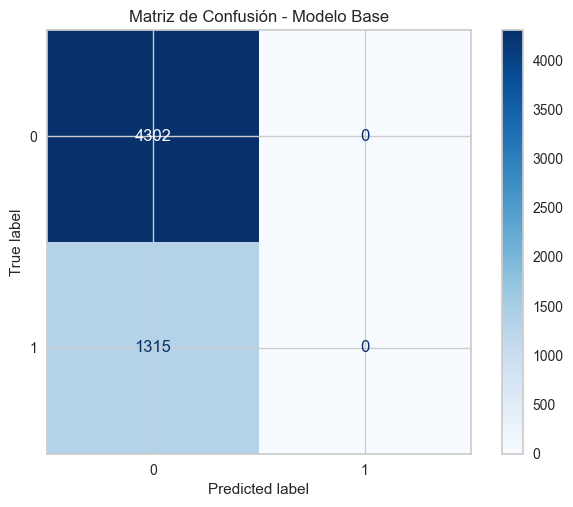

In [147]:
# Matriz de confusión del modelo base
ConfusionMatrixDisplay.from_estimator(dummy_clf, X_test_scaled, y_test, cmap='Blues')
plt.title("Matriz de Confusión - Modelo Base")
plt.show()

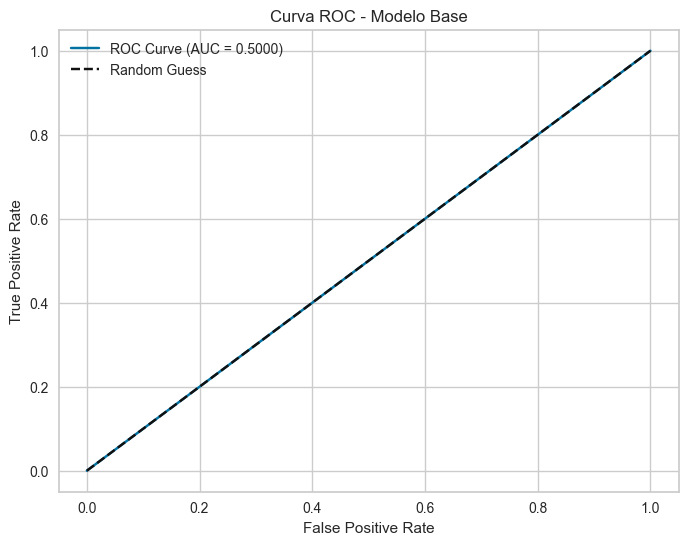

In [148]:
# Curva ROC del modelo base
fpr_dummy, tpr_dummy, thresholds_dummy = roc_curve(y_test, y_pred_proba_dummy)

plt.figure(figsize=(8, 6))
plt.plot(fpr_dummy, tpr_dummy, label=f"ROC Curve (AUC = {roc_auc_dummy:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Modelo Base")
plt.legend()
plt.show()

## RESUMEN EJERCICIO 3:

- Se eligio un modelo base de el mas frecuente, es decir predecir que no llovera en todos los casos
- Es esperable que solamente el acurracy sea la metrica que arroje un valor
- En la curva ROC podemos ver que el modelo base es identico a si hubieramos realizado un modelo base con prediccion aleatoria.

# EJERCICIO 4

## GRID SEARCH

In [149]:
# Configuración de la validación cruzada
kf = KFold(n_splits=5, shuffle=True, random_state=42)

In [150]:
# Espacio de búsqueda de hiperparámetros para Grid Search
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100, 300, 500],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [10, 50, 100, 500, 1000, 5000, 10000, 100000]
}

In [151]:
def run_grid_search(X_train, y_train, param_grid, cv):

    # Modelo base
    log_reg = LogisticRegression(max_iter=1000, random_state=42)
    
    # Configuración de Grid Search
    grid_search = GridSearchCV(
        estimator=log_reg,
        param_grid=param_grid,
        scoring='f1',  # Métrica a optimizar
        cv=cv,  # Validación cruzada
        verbose=1,
        n_jobs=-1  # Usar todos los núcleos disponibles
    )
    
    # Entrenamiento
    grid_search.fit(X_train, y_train)
    
    return grid_search

In [152]:
# Ejecutamos Grid Search
grid_search = run_grid_search(X_train_scaled, y_train, param_grid, kf)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {grid_search.best_params_}")

# Mejor modelo encontrado
best_log_reg = grid_search.best_estimator_

Fitting 5 folds for each of 840 candidates, totalling 4200 fits


/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-Frattini-Gallardo-Orazi/aa1-env/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-Frattini-Gallardo-Orazi/aa1-env/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-Frattini-Gallardo-Orazi/aa1-env/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-Frattini-Gallardo-Orazi/aa1-env/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Fac

Mejores hiperparámetros: {'C': 10, 'max_iter': 10, 'penalty': 'l2', 'solver': 'lbfgs'}


In [153]:
# Evaluación del mejor modelo en el conjunto de prueba
y_pred_best = best_log_reg.predict(X_test_scaled)
y_pred_proba_best = best_log_reg.predict_proba(X_test_scaled)[:, 1]

# Métricas del mejor modelo
accuracy_best = accuracy_score(y_test, y_pred_best)
precision_best = precision_score(y_test, y_pred_best)
recall_best = recall_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)

print(f"Mejor Modelo - Accuracy: {accuracy_best:.4f}")
print(f"Mejor Modelo - Precision: {precision_best:.4f}")
print(f"Mejor Modelo - Recall: {recall_best:.4f}")
print(f"Mejor Modelo - F1-Score: {f1_best:.4f}")
print(f"Mejor Modelo - ROC-AUC: {roc_auc_best:.4f}")

Mejor Modelo - Accuracy: 0.8380
Mejor Modelo - Precision: 0.7134
Mejor Modelo - Recall: 0.5148
Mejor Modelo - F1-Score: 0.5981
Mejor Modelo - ROC-AUC: 0.8721


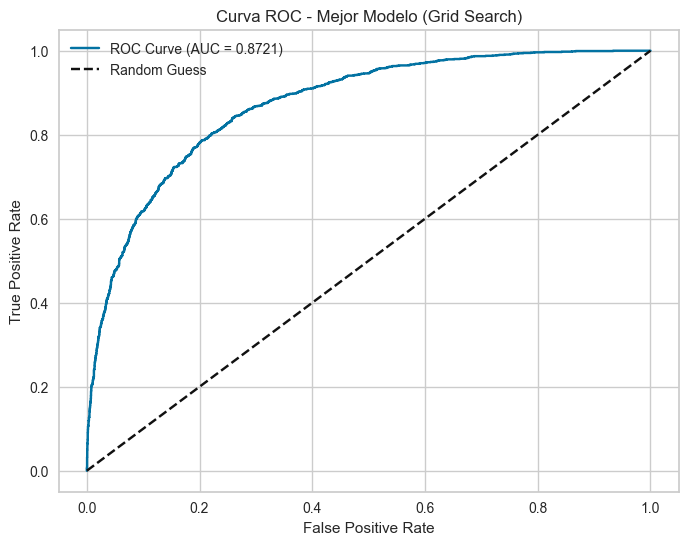

In [154]:
# Curva ROC del mejor modelo
fpr_best, tpr_best, thresholds_best = roc_curve(y_test, y_pred_proba_best)

plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, label=f"ROC Curve (AUC = {roc_auc_best:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Mejor Modelo (Grid Search)")
plt.legend()
plt.show()

## RANDOM SEARCH

In [155]:
# Espacio de búsqueda de hiperparámetros para Random Search
param_distributions = {
    'C': [0.01, 0.1, 1, 10, 100, 300, 500],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [10, 50, 100, 500, 1000, 5000, 10000, 100000]
}

In [156]:
def run_random_search(X_train, y_train, param_distributions, cv, n_iter=10):
    """
    Ejecuta Random Search con validación cruzada para encontrar los mejores hiperparámetros.
    """
    # Modelo base
    log_reg = LogisticRegression(max_iter=1000, random_state=42)
    
    # Configuración de Random Search
    random_search = RandomizedSearchCV(
        estimator=log_reg,
        param_distributions=param_distributions,
        scoring='f1',  # Métrica a optimizar
        cv=cv,  # Validación cruzada
        n_iter=n_iter,  # Número de iteraciones
        verbose=1,
        random_state=42,
        n_jobs=-1  # Usar todos los núcleos disponibles
    )
    
    # Entrenamiento
    random_search.fit(X_train, y_train)
    
    return random_search

In [157]:
# Ejecutamos Random Search
random_search = run_random_search(X_train_scaled, y_train, param_distributions, kf, n_iter=10)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {random_search.best_params_}")

# Mejor modelo encontrado
best_log_reg_random = random_search.best_estimator_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mejores hiperparámetros: {'solver': 'liblinear', 'penalty': 'l2', 'max_iter': 10000, 'C': 300}


In [158]:
# Evaluación del mejor modelo en el conjunto de prueba
y_pred_random = best_log_reg_random.predict(X_test_scaled)
y_pred_proba_random = best_log_reg_random.predict_proba(X_test_scaled)[:, 1]

# Métricas del mejor modelo
accuracy_random = accuracy_score(y_test, y_pred_random)
precision_random = precision_score(y_test, y_pred_random)
recall_random = recall_score(y_test, y_pred_random)
f1_random = f1_score(y_test, y_pred_random)
roc_auc_random = roc_auc_score(y_test, y_pred_proba_random)

print(f"Random Search - Accuracy: {accuracy_random:.4f}")
print(f"Random Search - Precision: {precision_random:.4f}")
print(f"Random Search - Recall: {recall_random:.4f}")
print(f"Random Search - F1-Score: {f1_random:.4f}")
print(f"Random Search - ROC-AUC: {roc_auc_random:.4f}")

Random Search - Accuracy: 0.8405
Random Search - Precision: 0.7231
Random Search - Recall: 0.5163
Random Search - F1-Score: 0.6025
Random Search - ROC-AUC: 0.8731


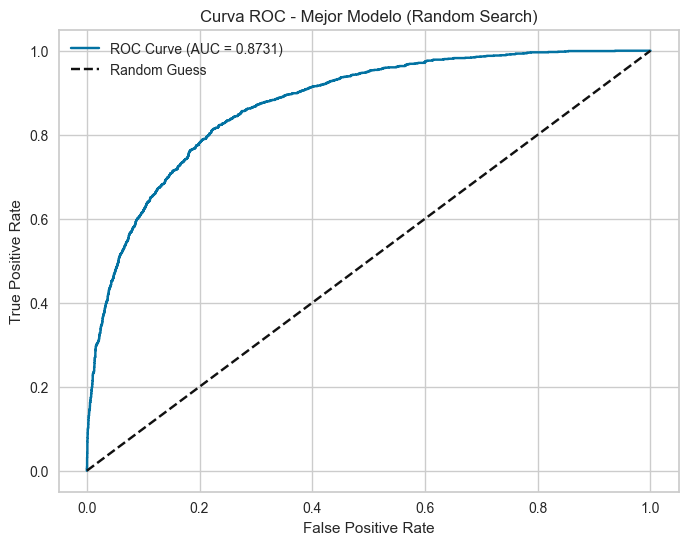

In [159]:
# Curva ROC del mejor modelo
fpr_random, tpr_random, thresholds_random = roc_curve(y_test, y_pred_proba_random)

plt.figure(figsize=(8, 6))
plt.plot(fpr_random, tpr_random, label=f"ROC Curve (AUC = {roc_auc_random:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Mejor Modelo (Random Search)")
plt.legend()
plt.show()

## OPTUNA

In [160]:
def objective(trial):
    """
    Función objetivo para Optuna. Define el espacio de búsqueda y evalúa el modelo.
    """
    # Espacio de búsqueda de hiperparámetros
    params = {
        'C': trial.suggest_loguniform('C', 0.01, 100),  # Regularización (rango logarítmico)
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag']),  # Algoritmo de optimización
        'penalty': trial.suggest_categorical('penalty', ['l2'])  # Tipo de regularización
    }

    # Modelo base con los hiperparámetros sugeridos
    model = LogisticRegression(max_iter=1000, random_state=42, **params)

    # Evaluación con validación cruzada (usando F1-score)
    scores = cross_val_score(model, X_train_scaled, y_train, cv=kf, scoring='f1', n_jobs=-1)

    # Retornamos el promedio del F1-score
    return scores.mean()

In [161]:
def run_optuna(X_train, y_train, n_trials=50):
    """
    Ejecuta Optuna para encontrar los mejores hiperparámetros.
    """
    # Creamos un estudio de Optuna
    study = optuna.create_study(direction='maximize')  # Maximizamos el F1-score

    # Ejecutamos la optimización
    study.optimize(lambda trial: objective(trial), n_trials=n_trials)

    return study

In [162]:
# Ejecutamos Optuna
study = run_optuna(X_train_scaled, y_train, n_trials=50)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {study.best_params}")

# Mejor valor de la métrica (F1-score)
print(f"Mejor F1-score: {study.best_value}")

[I 2025-02-09 21:20:08,543] A new study created in memory with name: no-name-6e25bc54-9ca7-4571-89d7-d261e14b87bf
[I 2025-02-09 21:20:08,759] Trial 0 finished with value: 0.5815713169860034 and parameters: {'C': 1.2385203668292357, 'solver': 'newton-cg', 'penalty': 'l2'}. Best is trial 0 with value: 0.5815713169860034.
[I 2025-02-09 21:20:08,939] Trial 1 finished with value: 0.5818669014836025 and parameters: {'C': 2.677191532758657, 'solver': 'lbfgs', 'penalty': 'l2'}. Best is trial 1 with value: 0.5818669014836025.
[I 2025-02-09 21:20:09,206] Trial 2 finished with value: 0.5798494297623813 and parameters: {'C': 0.01513045888221417, 'solver': 'liblinear', 'penalty': 'l2'}. Best is trial 1 with value: 0.5818669014836025.
[I 2025-02-09 21:20:09,397] Trial 3 finished with value: 0.5810967439255513 and parameters: {'C': 0.3337159868065256, 'solver': 'newton-cg', 'penalty': 'l2'}. Best is trial 1 with value: 0.5818669014836025.
[I 2025-02-09 21:20:09,589] Trial 4 finished with value: 0.581

Mejores hiperparámetros: {'C': 80.73512098250785, 'solver': 'lbfgs', 'penalty': 'l2'}
Mejor F1-score: 0.5821872856585779


In [163]:
# Entrenamos el modelo con los mejores hiperparámetros
best_model_optuna = LogisticRegression(
    max_iter=1000,
    random_state=42,
    **study.best_params
)
best_model_optuna.fit(X_train_scaled, y_train)

# Evaluamos el modelo en el conjunto de prueba
y_pred_optuna = best_model_optuna.predict(X_test_scaled)
y_pred_proba_optuna = best_model_optuna.predict_proba(X_test_scaled)[:, 1]

# Métricas del modelo
accuracy_optuna = accuracy_score(y_test, y_pred_optuna)
precision_optuna = precision_score(y_test, y_pred_optuna)
recall_optuna = recall_score(y_test, y_pred_optuna)
f1_optuna = f1_score(y_test, y_pred_optuna)
roc_auc_optuna = roc_auc_score(y_test, y_pred_proba_optuna)

print(f"Optuna - Accuracy: {accuracy_optuna:.4f}")
print(f"Optuna - Precision: {precision_optuna:.4f}")
print(f"Optuna - Recall: {recall_optuna:.4f}")
print(f"Optuna - F1-Score: {f1_optuna:.4f}")
print(f"Optuna - ROC-AUC: {roc_auc_optuna:.4f}")

Optuna - Accuracy: 0.8405
Optuna - Precision: 0.7236
Optuna - Recall: 0.5156
Optuna - F1-Score: 0.6021
Optuna - ROC-AUC: 0.8731


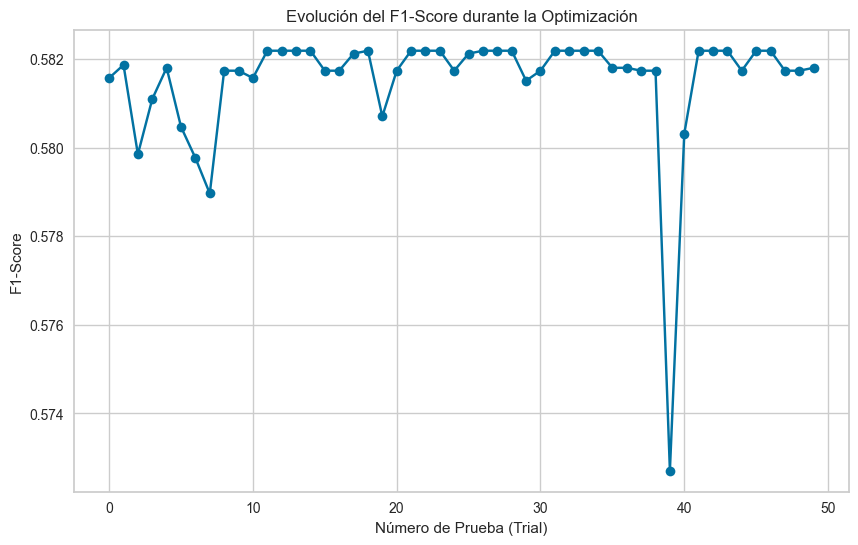

In [164]:
# Extraer los valores de las pruebas (trials) y sus F1-scores
trial_numbers = [trial.number for trial in study.trials]
f1_scores = [trial.value for trial in study.trials]

# Graficar la evolución del F1-score
plt.figure(figsize=(10, 6))
plt.plot(trial_numbers, f1_scores, marker='o', linestyle='-', color='b')
plt.xlabel("Número de Prueba (Trial)")
plt.ylabel("F1-Score")
plt.title("Evolución del F1-Score durante la Optimización")
plt.grid(True)
plt.show()

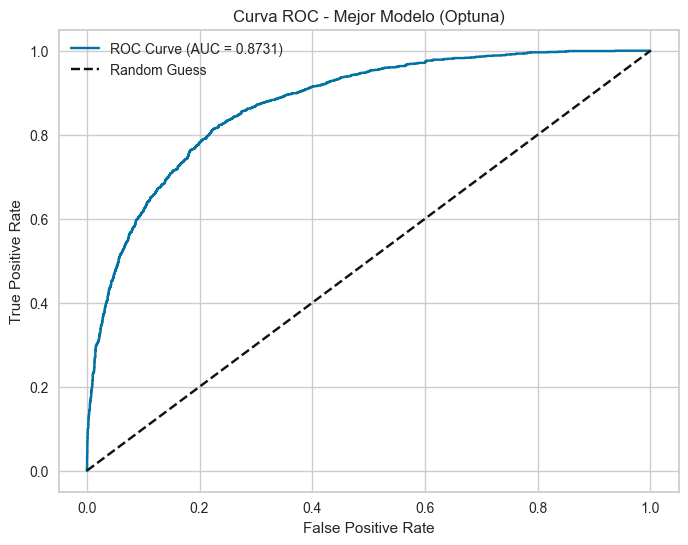

In [165]:
# Curva ROC del mejor modelo
fpr_optuna, tpr_optuna, thresholds_optuna = roc_curve(y_test, y_pred_proba_optuna)

plt.figure(figsize=(8, 6))
plt.plot(fpr_optuna, tpr_optuna, label=f"ROC Curve (AUC = {roc_auc_optuna:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Mejor Modelo (Optuna)")
plt.legend()
plt.show()

## RESUMEN EJERCICIO 4:

- Se busco la optimizacion de hiperparametros por 3 metodos diferentes, GridSearch, RandomSearch, Optuna.
- GridSearch fue el que arrojo un menor f1-score con los hiperparametros optimizados.
- RandomSearch y Optuna obtuvieron un resultado identico.

# EJERCICIO 5

## Regresion Logistica

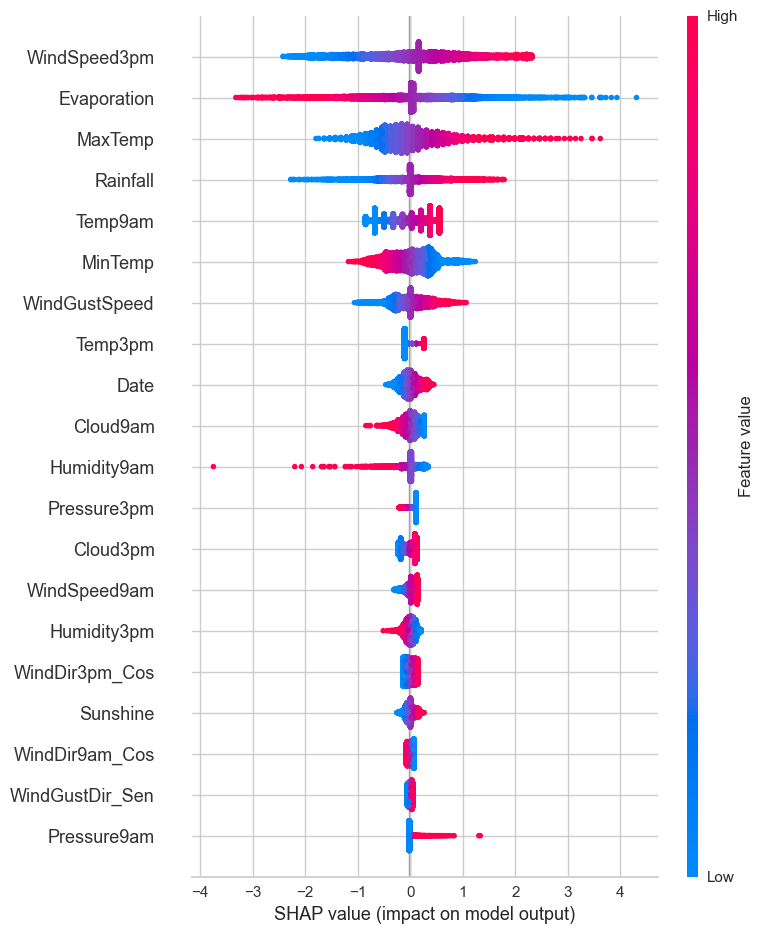

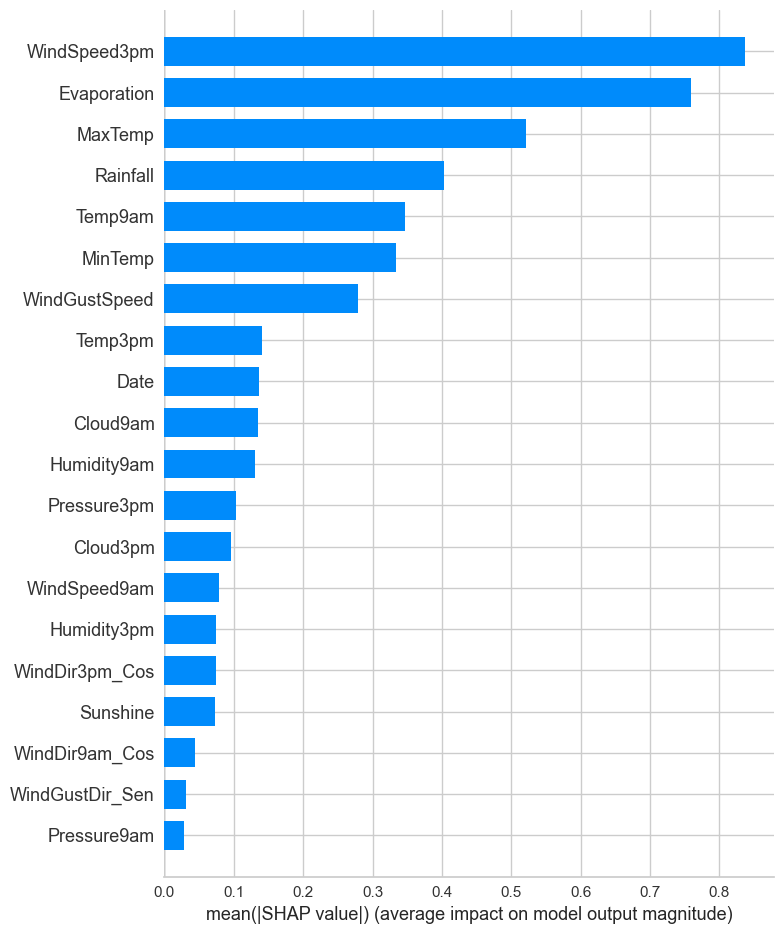

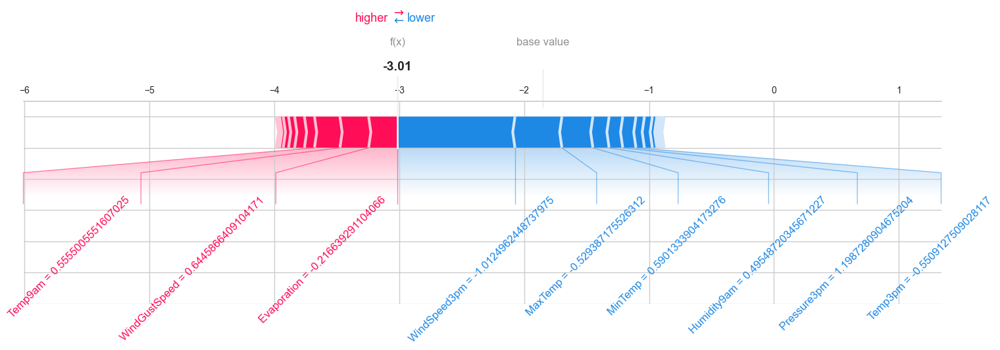

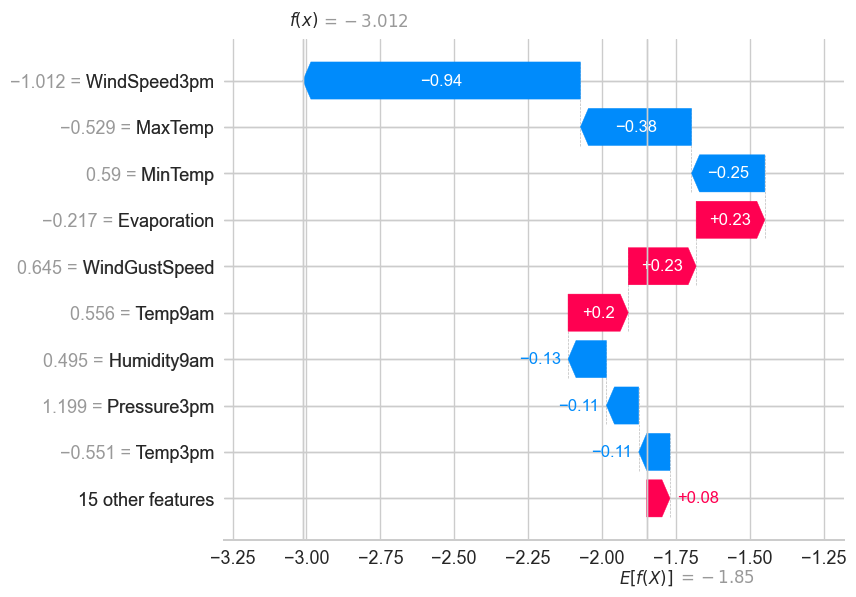

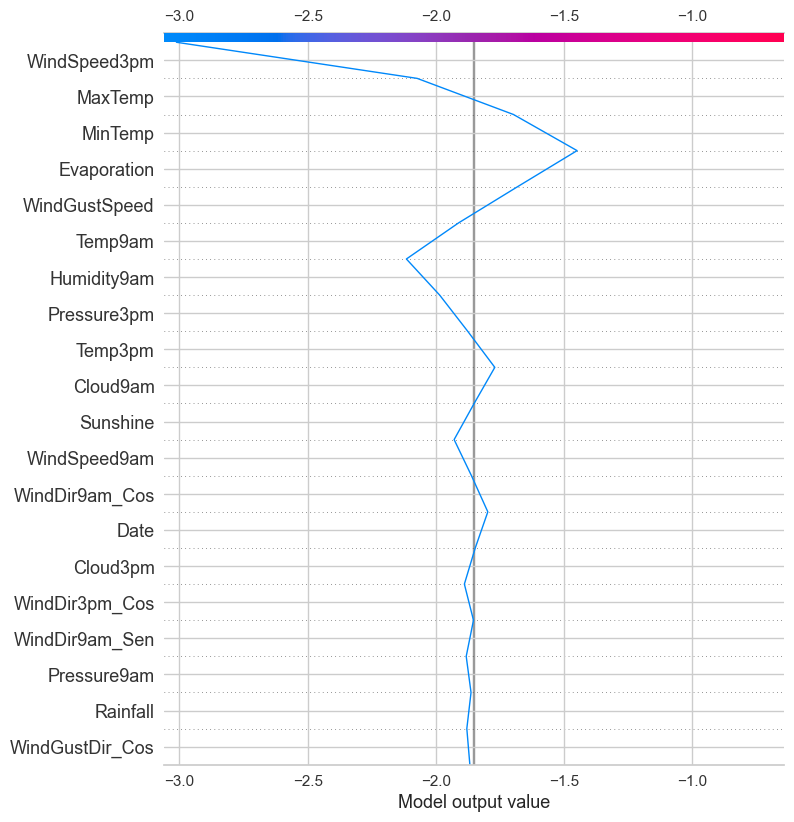

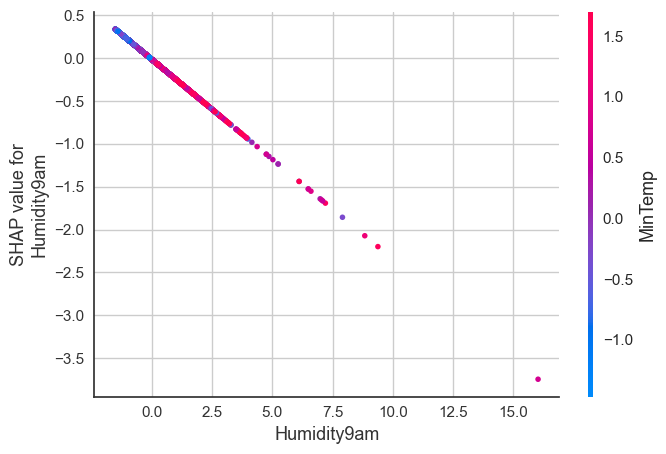

In [166]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(log_reg, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)



## Regresion logistica balanceada

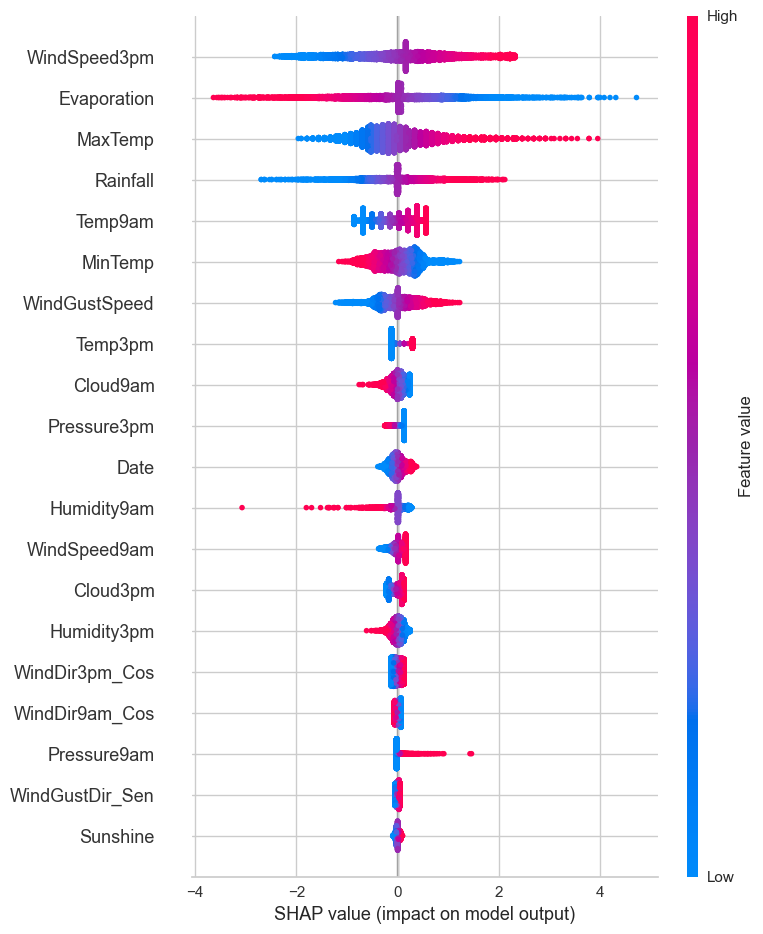

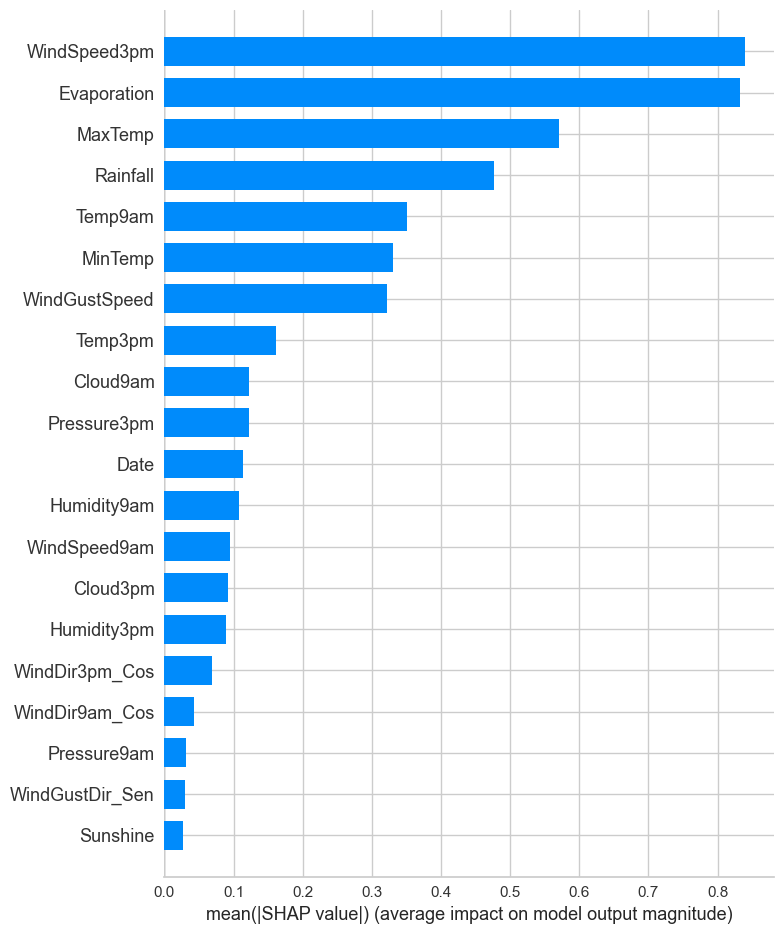

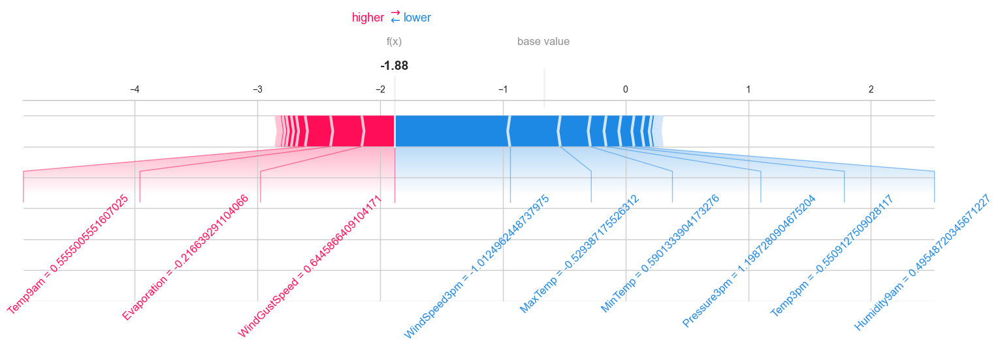

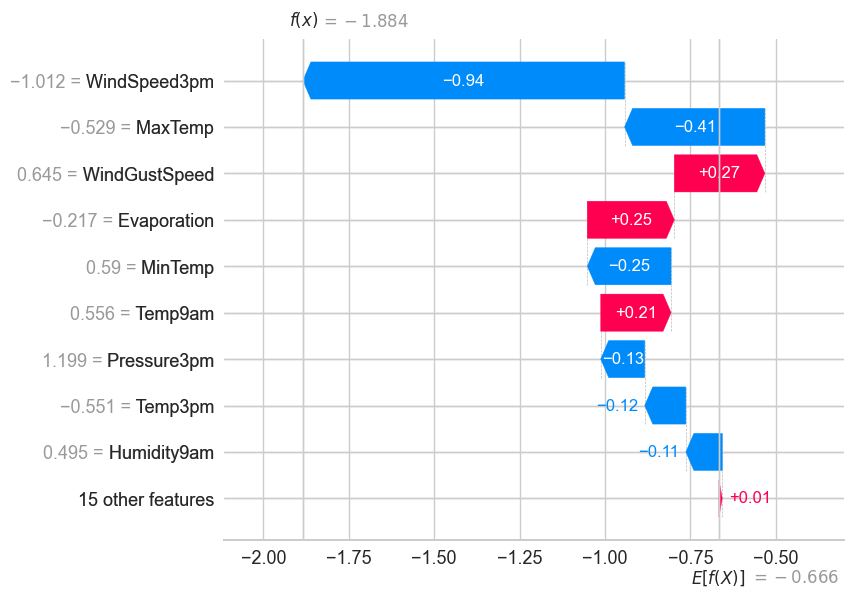

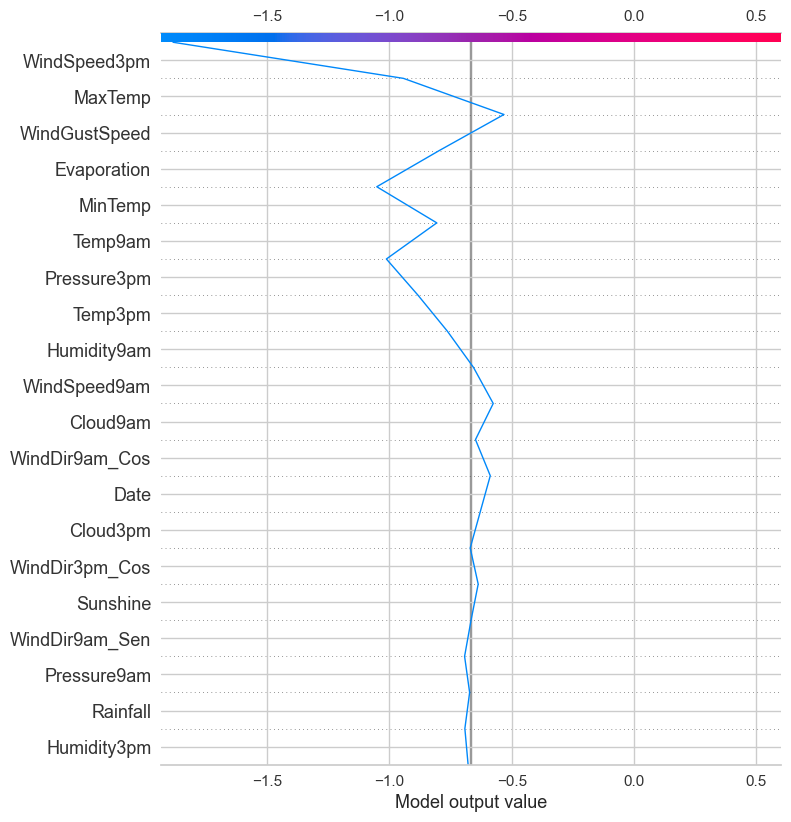

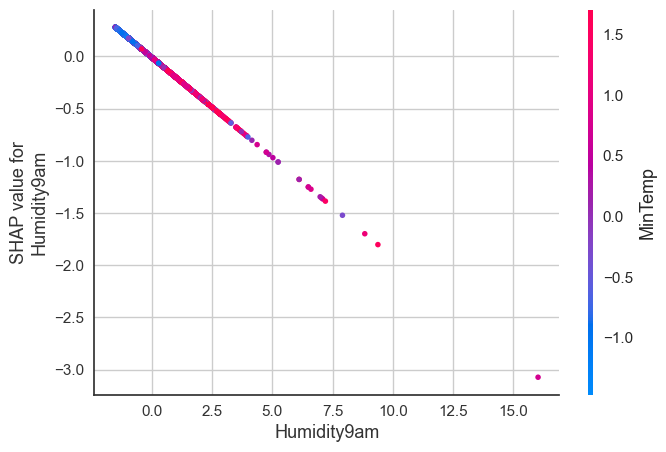

In [167]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(log_reg_balanced, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## Regresion Logistica con oversampling SMOTE

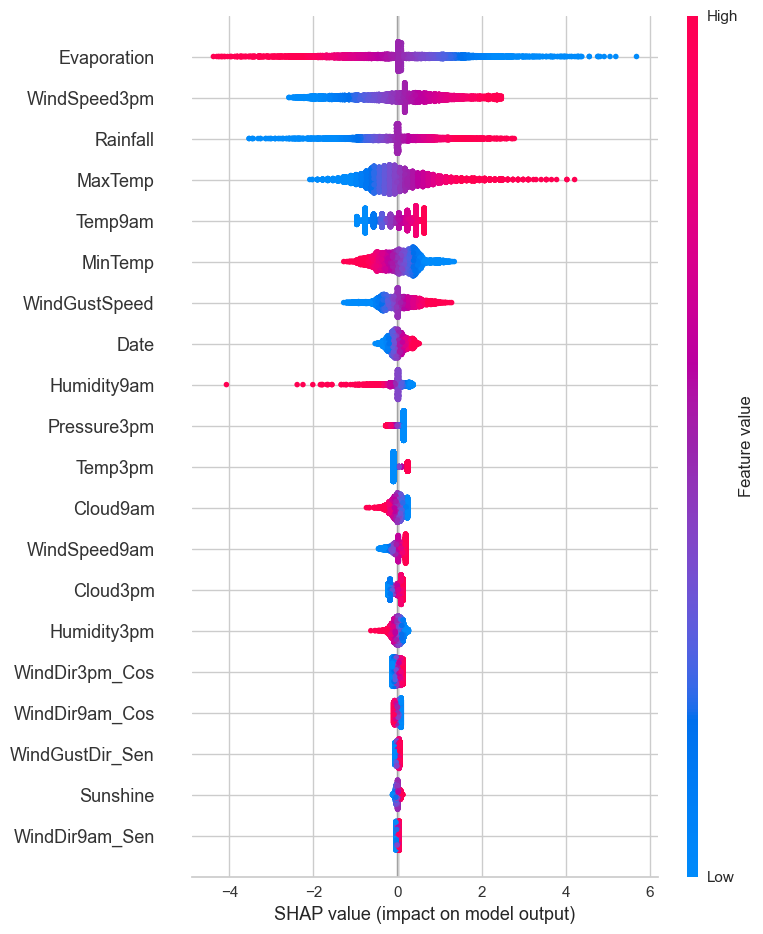

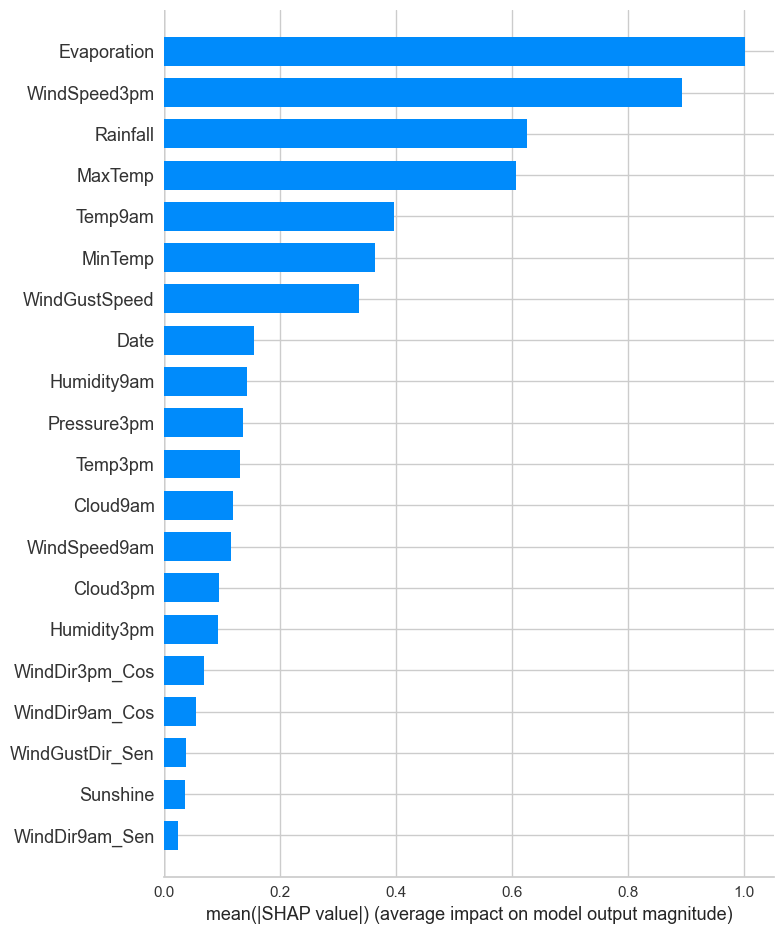

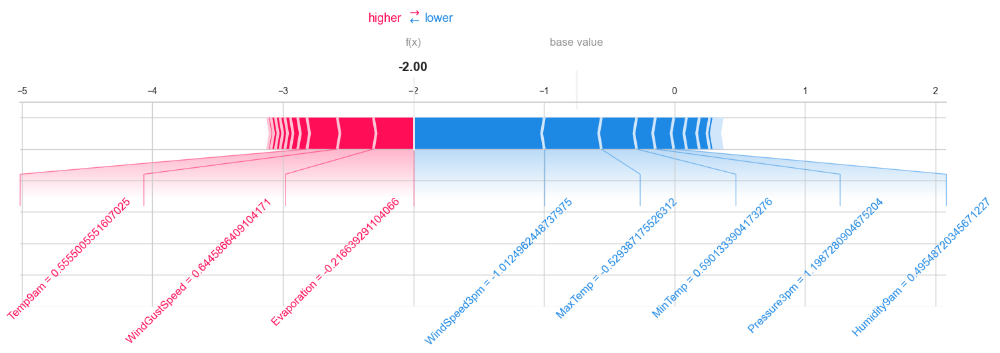

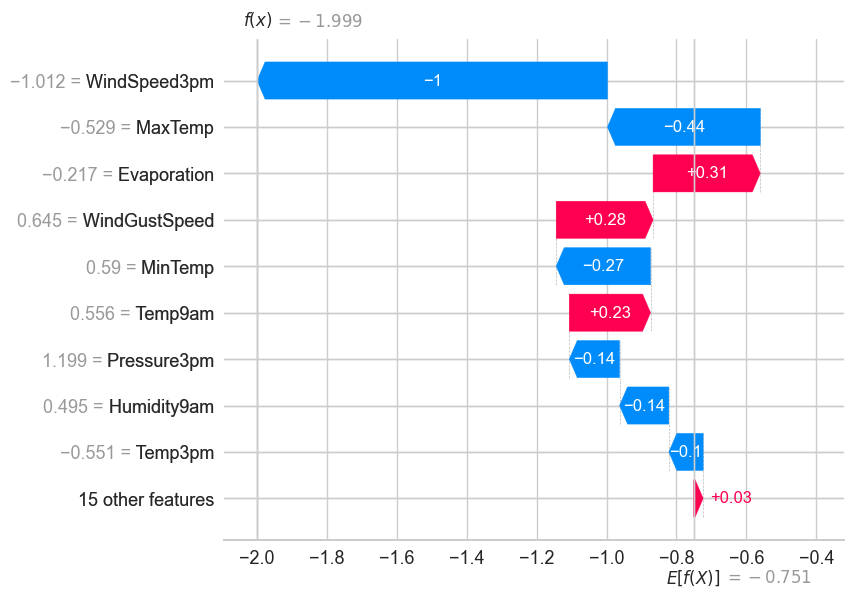

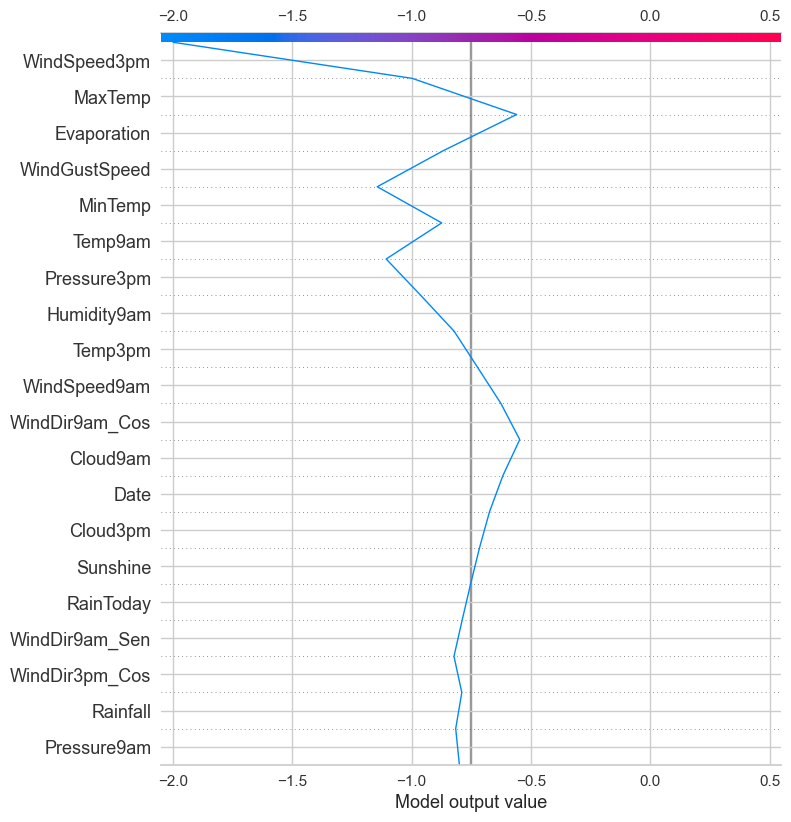

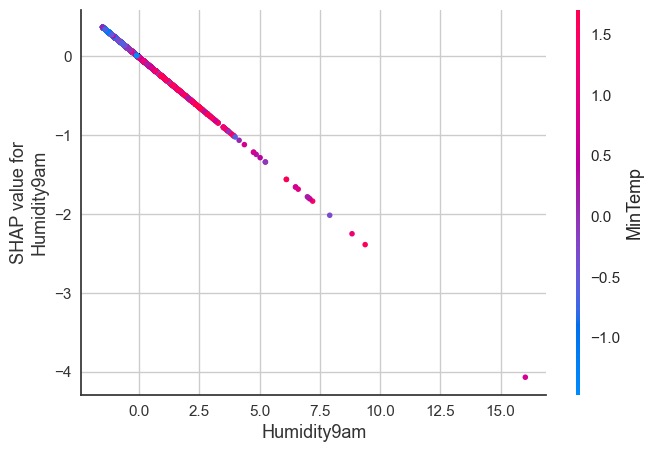

In [168]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(log_reg_smote, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## Regresion logistica con GridSearch

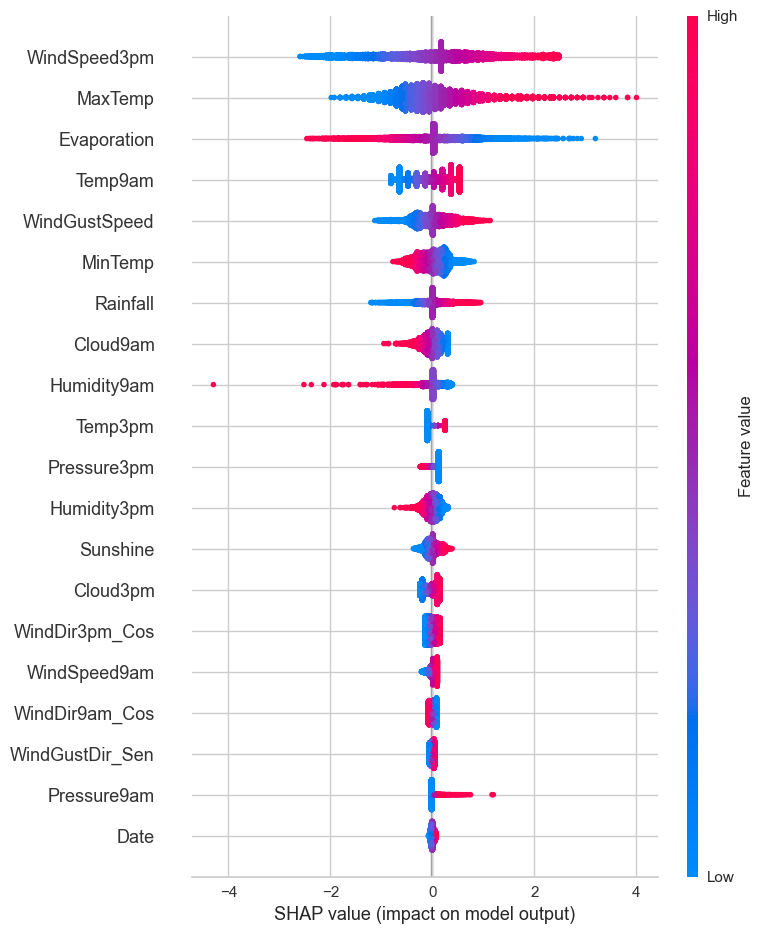

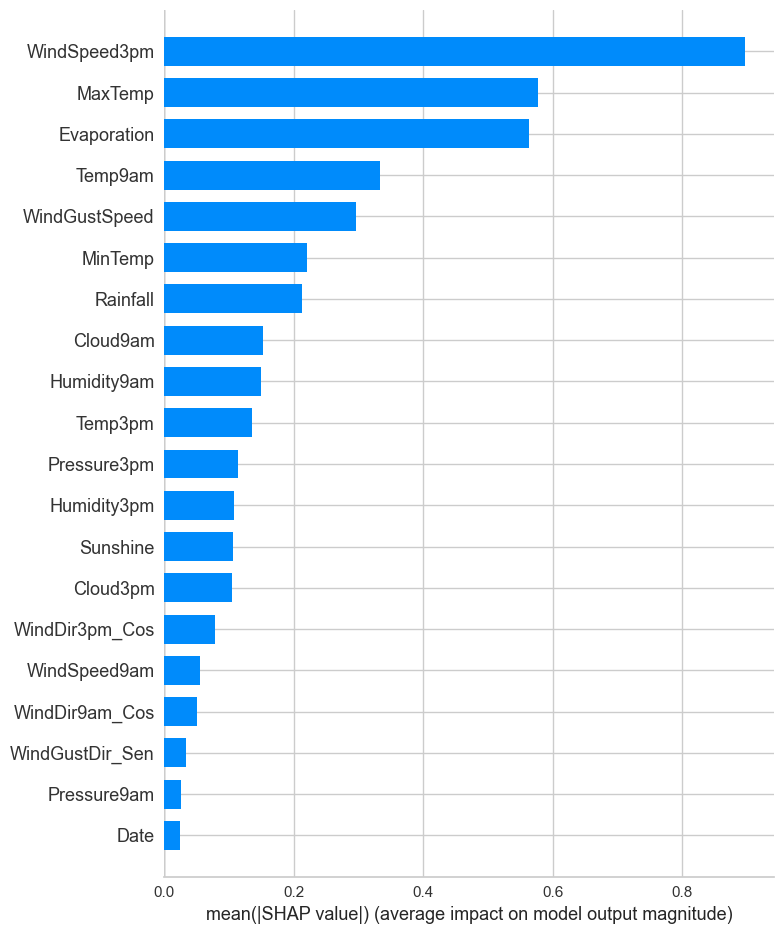

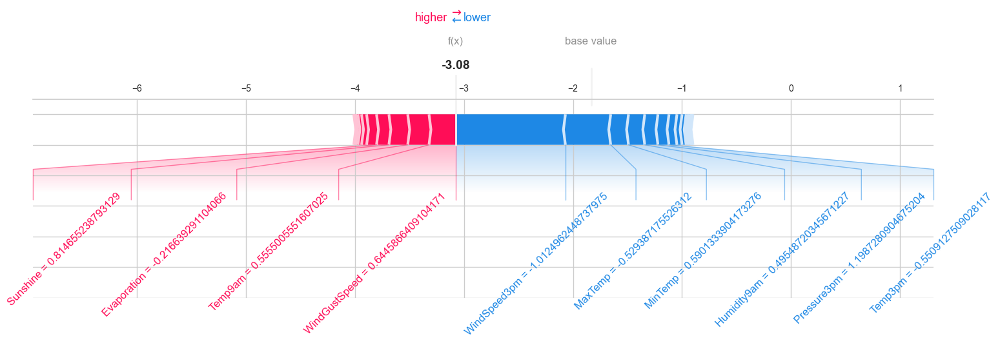

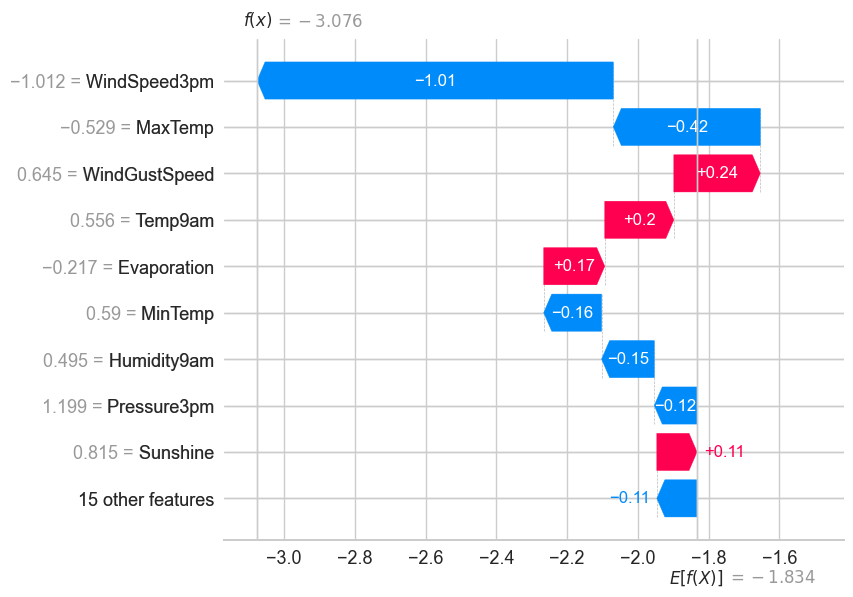

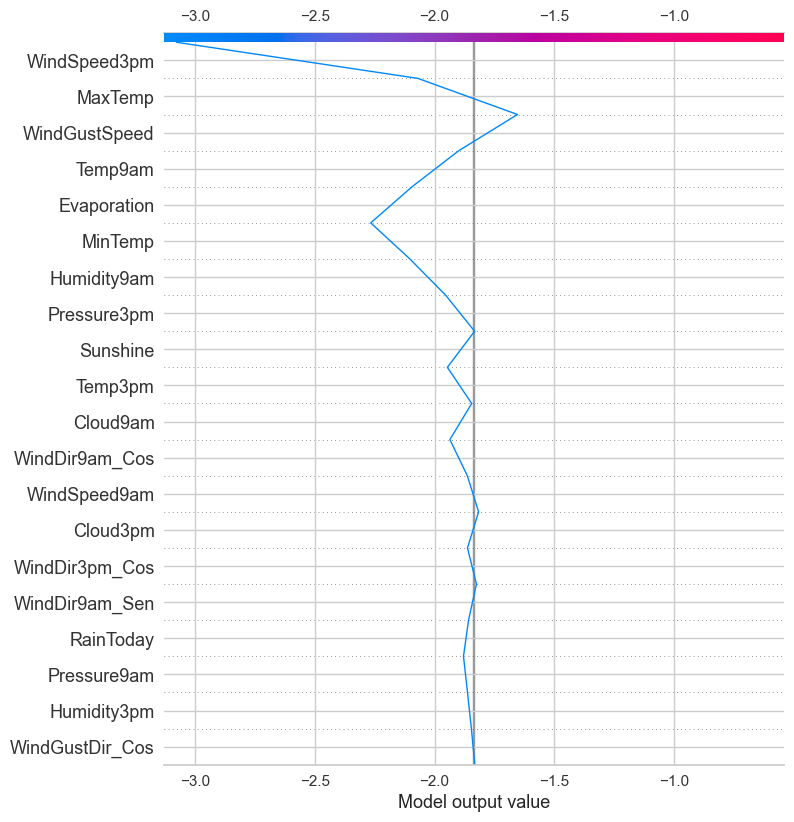

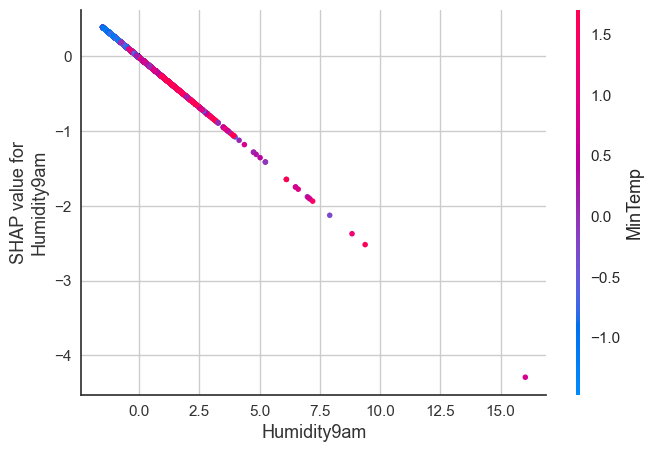

In [169]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(best_log_reg, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## Regresion logistica con RandomSeach

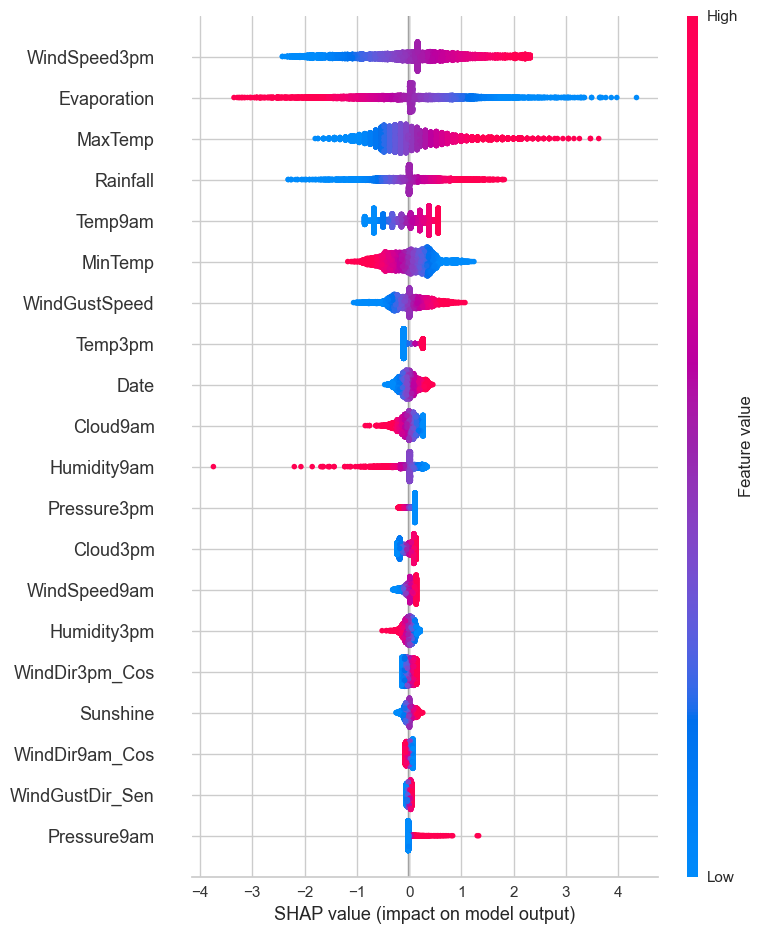

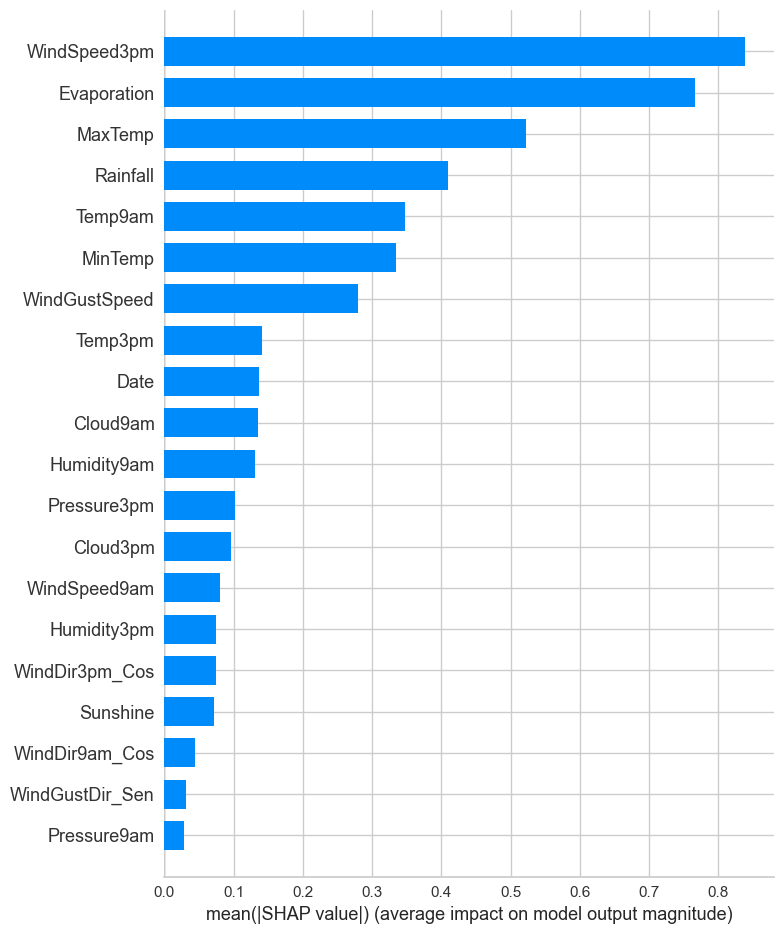

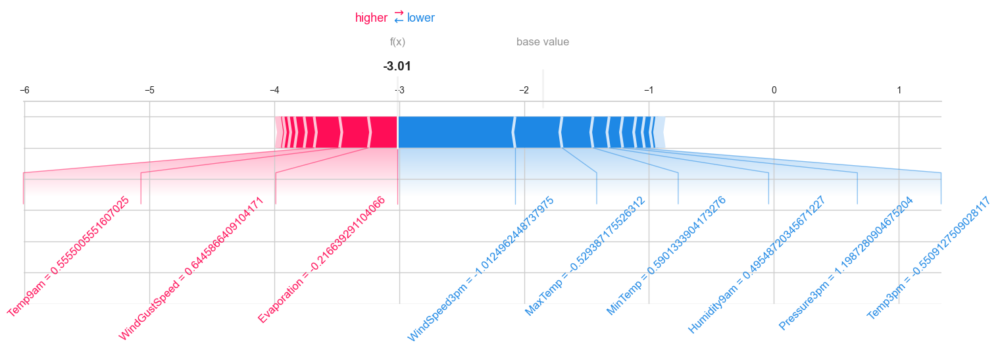

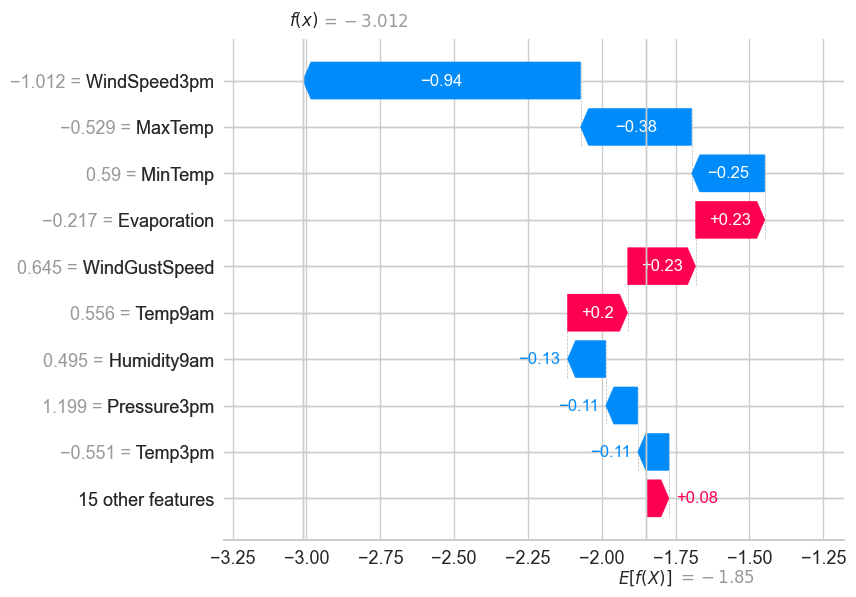

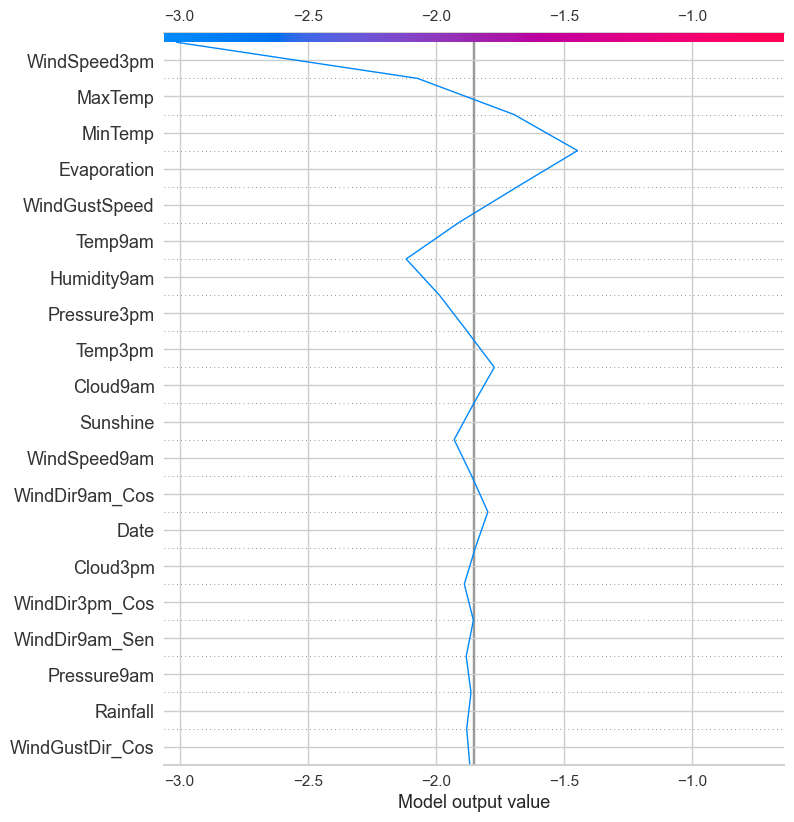

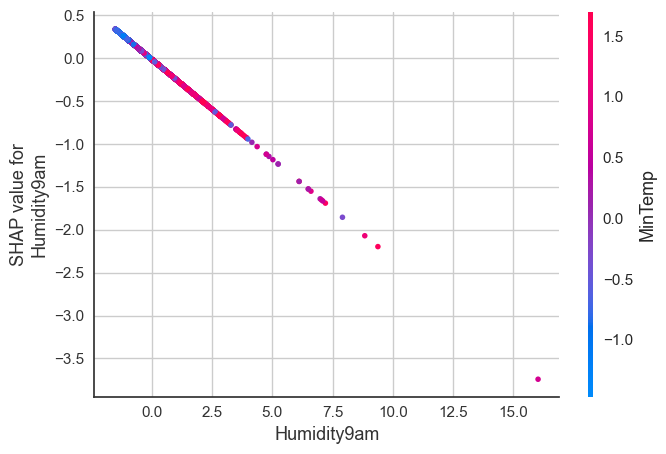

In [170]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(best_log_reg_random, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## Regresion Logisticia con OPTUNA

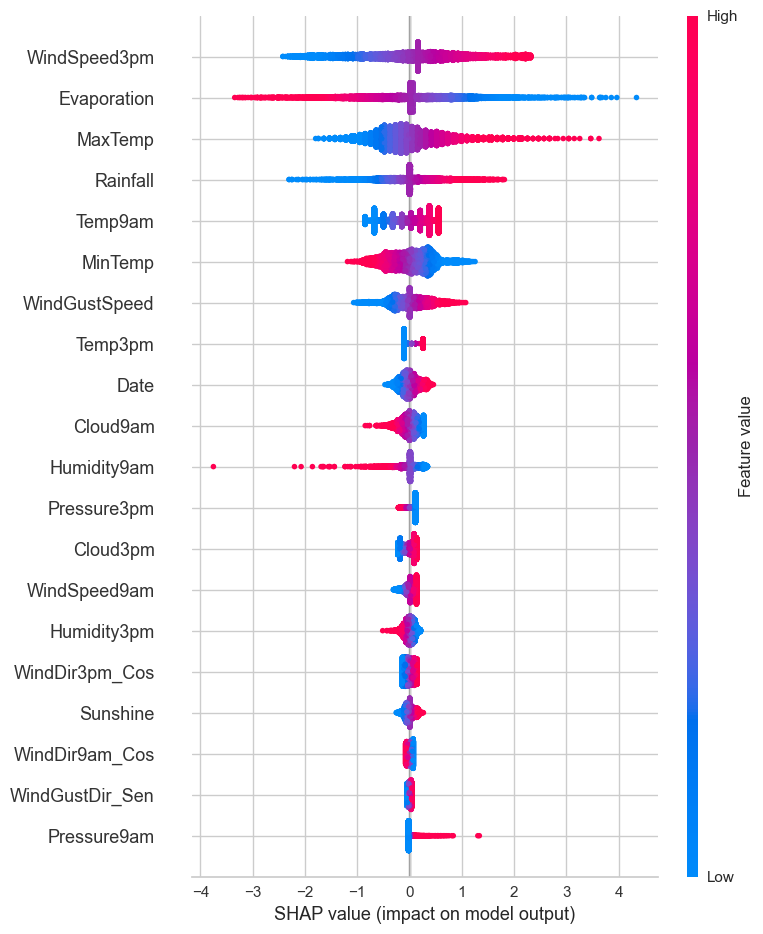

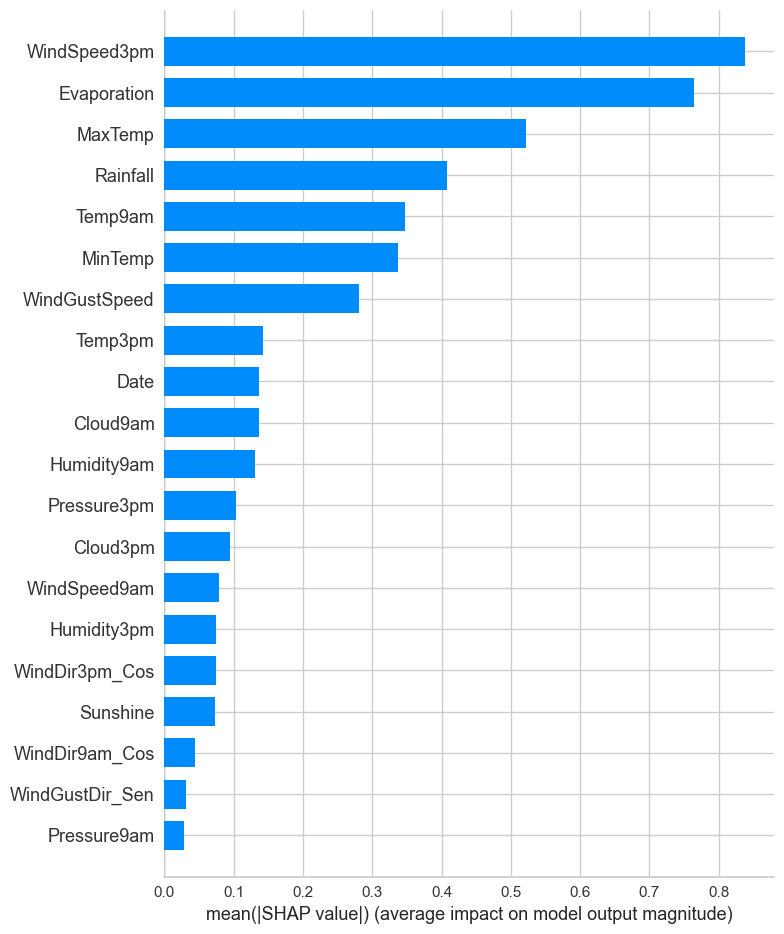

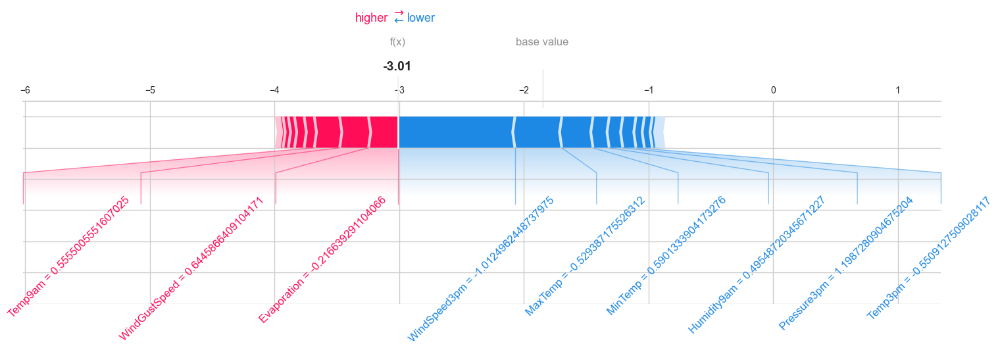

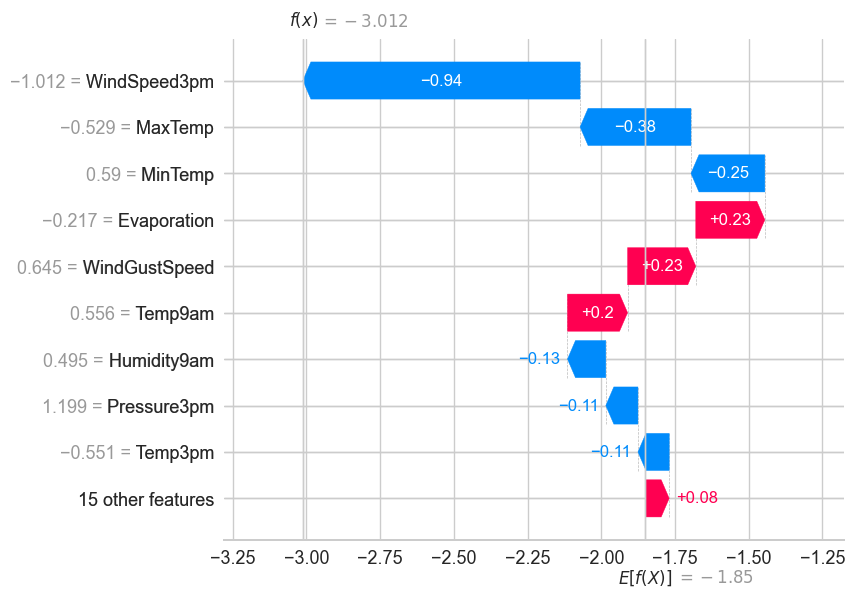

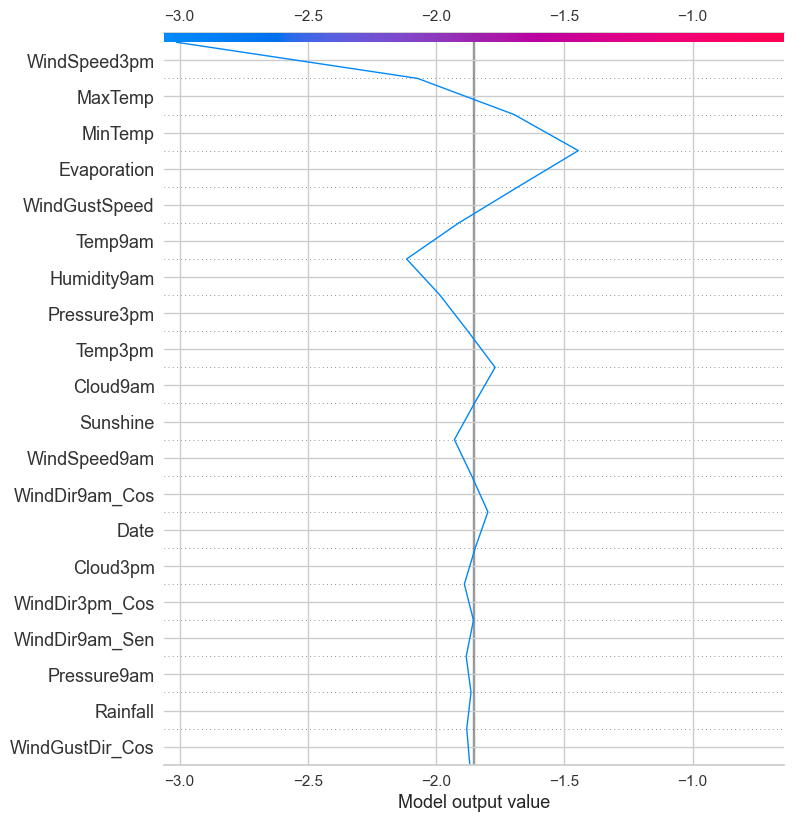

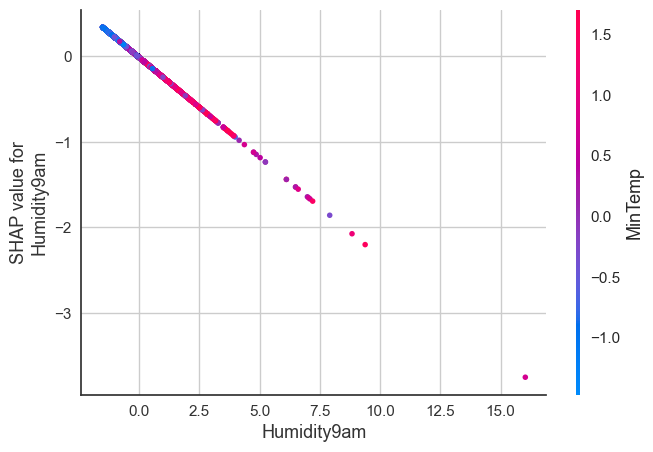

In [171]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(best_model_optuna, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico de decisión para una observación específica
shap.decision_plot(explainer.expected_value, shap_values[0].values, feature_names=list(X_train.columns))
plt.show()

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## Resumen Ejercicio 5

- Se realizaron los SHAP explanations para los 6 modelos entrenados hasta el momento.
- En las graficas globales podemos apreciar cuales son las variables con mayor peso en cada uno de los modelos.
    como en el caso de Optuna son WindSpeed3pm y Evaporation
- Las graficas locales nos permiten analizar cuanto afecto cada variable en una prediccion concreta.

# EJERCICIO 6

In [172]:
X = df_depurado.drop('RainTomorrow', axis=1)
y = df_depurado['RainTomorrow']

# Dividimos nuestro conjunto de datos en dos partes, la parte de entrenamiento y la parte de prueba.
# La division que hacemos de los datos son de 80/20, donde el 80 es para entrenamiento y el 20 restante para hacer un testeo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Para hacer Regrecion Logistica
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

train_data = pd.concat([X_train, y_train], axis=1)

clf = setup(data=train_data, target='RainTomorrow', session_id=42, test_data=pd.concat([X_test, y_test], axis=1))

best_model = compare_models()

,Description,Value
0,Session id,42
1,Target,RainTomorrow
2,Target type,Binary
3,Original data shape,"(28083, 25)"
4,Transformed data shape,"(28083, 25)"
5,Transformed train set shape,"(22466, 25)"
6,Transformed test set shape,"(5617, 25)"
7,Numeric features,24
8,Rows with missing values,62.8%
9,Preprocess,True


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8502,0.8868,0.5636,0.7336,0.6374,0.5450,0.5526,0.3950
rf,Random Forest Classifier,0.8499,0.8837,0.5244,0.7589,0.6201,0.5305,0.5446,0.5410
et,Extra Trees Classifier,0.8472,0.8813,0.5002,0.7648,0.6046,0.5150,0.5329,0.3440
gbc,Gradient Boosting Classifier,0.8467,0.8777,0.5312,0.7393,0.6181,0.5254,0.5367,0.9780
ada,Ada Boost Classifier,0.8378,0.8653,0.5250,0.7051,0.6017,0.5026,0.5113,0.2030
lr,Logistic Regression,0.8346,0.8592,0.4922,0.7115,0.5816,0.4828,0.4957,0.4460
lda,Linear Discriminant Analysis,0.8339,0.8643,0.5110,0.6977,0.5898,0.4887,0.4981,0.0240
ridge,Ridge Classifier,0.8313,0.8642,0.4459,0.7273,0.5526,0.4559,0.4768,0.0130
knn,K Neighbors Classifier,0.8301,0.8224,0.5107,0.6830,0.5842,0.4803,0.4884,0.1080
qda,Quadratic Discriminant Analysis,0.8175,0.8365,0.5270,0.6314,0.5742,0.4593,0.4626,0.0230


[LightGBM] [Info] Number of positive: 4723, number of negative: 15496
[LightGBM] [Info] Number of positive: 4723, number of negative: 15496
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2554
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2553
[LightGBM] [Info] Number of data points in the train set: 20219, number of used features: 24
[LightGBM] [Info] Number of data points in the train set: 20219, number of used features: 24
[LightGBM] [Info] Number of positive: 4723, number of negative: 15496
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.233592 -> initscore=-1.188138
[Lig

## Resumen Ejercicio 6

- Se utilizo AutoML para analizar cual es el mejor modelo
- Podemos apreciar que el modelo que mejor se adapta a nuesto dataset es el xgboost, ya que es el que posee mayor F1-score

# EJERCICIO 7

In [173]:
# Crear el modelo Red Neuronal

MODELO_RN = Sequential()
MODELO_RN.add(Dense(48, activation='relu', input_shape=(X_train_scaled.shape[1],)))  # Capa de entrada
MODELO_RN.add(Dense(10, activation='relu'))  # Capa oculta
MODELO_RN.add(Dense(1, activation='sigmoid'))  # Capa de salida para clasificación binaria

In [174]:
# Compilar el modelo
MODELO_RN.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [175]:
# Entrenamiento del modelo
history = MODELO_RN.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - accuracy: 0.7742 - loss: 0.4701 - val_accuracy: 0.8351 - val_loss: 0.3725
Epoch 2/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 661us/step - accuracy: 0.8360 - loss: 0.3741 - val_accuracy: 0.8402 - val_loss: 0.3602
Epoch 3/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - accuracy: 0.8391 - loss: 0.3610 - val_accuracy: 0.8407 - val_loss: 0.3597
Epoch 4/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 667us/step - accuracy: 0.8389 - loss: 0.3625 - val_accuracy: 0.8433 - val_loss: 0.3551
Epoch 5/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 666us/step - accuracy: 0.8433 - loss: 0.3497 - val_accuracy: 0.8416 - val_loss: 0.3571
Epoch 6/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - accuracy: 0.8499 - loss: 0.3434 - val_accuracy: 0.8433 - val_loss: 0.3556
Epoch 7/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - accuracy: 0.8512 - loss: 0.3379 - val_accuracy: 0.8474 - val_loss: 0.3532
Epoch 8/20
562/562 ━━━━━━━━━━━━━━━━━━━━ 0s 656us/step - accuracy: 0.8486 - loss: 0.3420 - 

In [ ]:
# Evaluacion del modelo
loss, accuracy = MODELO_RN.evaluate(X_test_scaled, y_test)
print(f'Accuracy: {accuracy:.4f}')

176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - accuracy: 0.8359 - loss: 0.3487
Accuracy: 0.8417


In [177]:
y_pred = MODELO_RN.predict(X_test_scaled)
print(y_pred)
y_pred = np.array(y_pred)
y_pred = np.round(y_pred)
f1 = f1_score(y_test, y_pred)
print(f1)

176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step
[[0.00809666]
 [0.1486599 ]
 [0.0677142 ]
 ...
 [0.00333092]
 [0.00211599]
 [0.03057261]]
0.6402266288951841


In [178]:
#metricas(y_test, y_pred)

In [179]:
# Optimización bayesiana

def create_model(optimizer='Adam', epochs=50, batch_size=32, neurons_1=32, neurons_2=16):
    # Crea el modelo de Keras
    model = Sequential()
    model.add(Dense(neurons_1, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dense(neurons_2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy']) 
    return model

def objective(params):
    # Desempaqueta los parámetros
    optimizer, epochs, batch_size, neurons_1, neurons_2 = params
    print(f"OPT: {params[0]} EPC: {params[1]} BTC: {params[2]} NEU1: {params[3]} NEU2: {params[4]}")
    # Crea el modelo con los parámetros actuales
    model = create_model(optimizer, epochs, batch_size, neurons_1, neurons_2)

    # Entrena el modelo
    history = model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
    # Evaluación del modelo
    y_pred = model.predict(X_test_scaled)
    y_pred = np.array(y_pred)
    y_pred = np.round(y_pred)
    f1 = f1_score(y_test, y_pred)
    print(f1)
    return -f1  # Negativo para maximizar

# Espacio de búsqueda
space = [
    ('Adam', 'SGD'),  
    (20, 50),  
    (16, 32),
    (10, 50),
    (10, 50)
]

# Optimización bayesiana
result = gp_minimize(objective, space, n_calls=50, random_state=42)

OPT: SGD EPC: 26 BTC: 28 NEU1: 34 NEU2: 28
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step
0.6286460600783631
OPT: Adam EPC: 34 BTC: 21 NEU1: 16 NEU2: 36
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step
0.6134380453752182
OPT: Adam EPC: 42 BTC: 31 NEU1: 10 NEU2: 50
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step
0.6194766194766195
OPT: SGD EPC: 38 BTC: 16 NEU1: 11 NEU2: 31
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 602us/step
0.6210851345390384
OPT: Adam EPC: 21 BTC: 32 NEU1: 19 NEU2: 14
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 622us/step
0.6528066528066528
OPT: SGD EPC: 31 BTC: 32 NEU1: 29 NEU2: 44
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step
0.635042735042735
OPT: SGD EPC: 34 BTC: 16 NEU1: 48 NEU2: 33
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 570us/step
0.6437448218724109
OPT: Adam EPC: 20 BTC: 20 NEU1: 20 NEU2: 37
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step
0.6344359626802375
OPT: SGD EPC: 45 BTC: 19 NEU1: 26 NEU2: 17
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step
0.6245674740484429
OPT: SGD EPC: 33 BTC: 19 NEU1: 33 NEU2: 11
176/176 ━

In [180]:
# Los mejores parámetros
print("Mejores parámetros:", result.x)

optimizer, epochs, batch_size, neurons_1, neurons_2 = result.x

modelo_rn_best = create_model(optimizer,epochs,batch_size,neurons_1,neurons_2)
history = modelo_rn_best.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
MODELO_RN_OPTIMIZADO = modelo_rn_best

Mejores parámetros: ['Adam', 21, 32, 19, 14]


In [181]:
X_reduced = X_test_scaled[:1000]

In [182]:
explainer = shap.Explainer(MODELO_RN, X_reduced)
explanation = explainer(X_reduced[:1000])

PermutationExplainer explainer: 1001it [00:25, 25.54it/s]                         


In [183]:
shap_values = explainer(X_reduced)

PermutationExplainer explainer: 1001it [00:22, 25.33it/s]                         


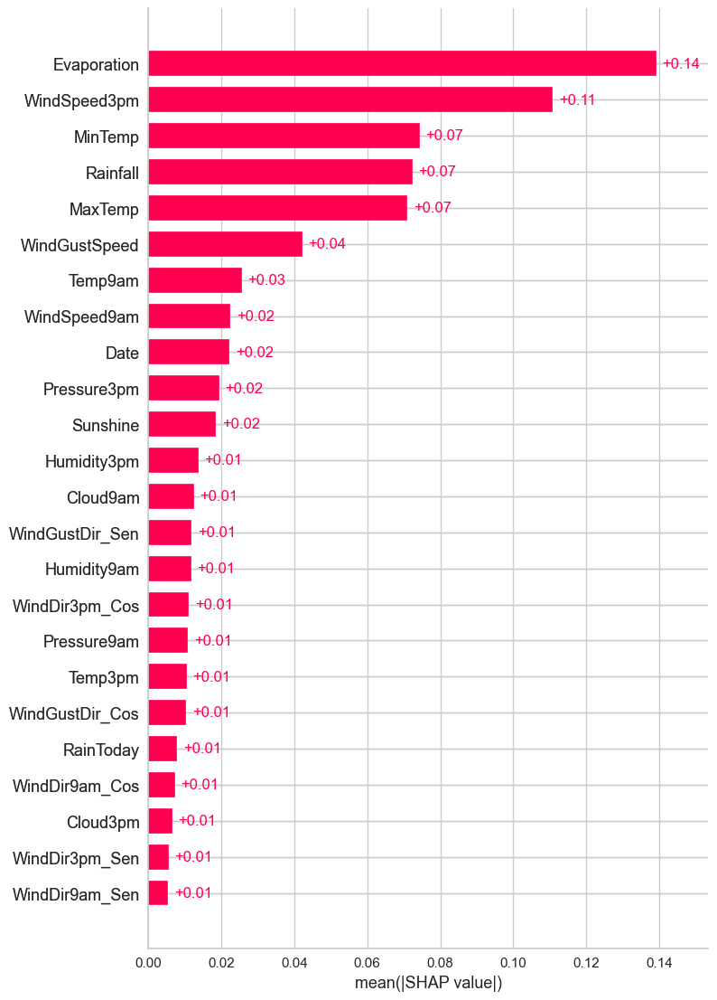

In [184]:
shap.plots.bar(shap_values, max_display=30)

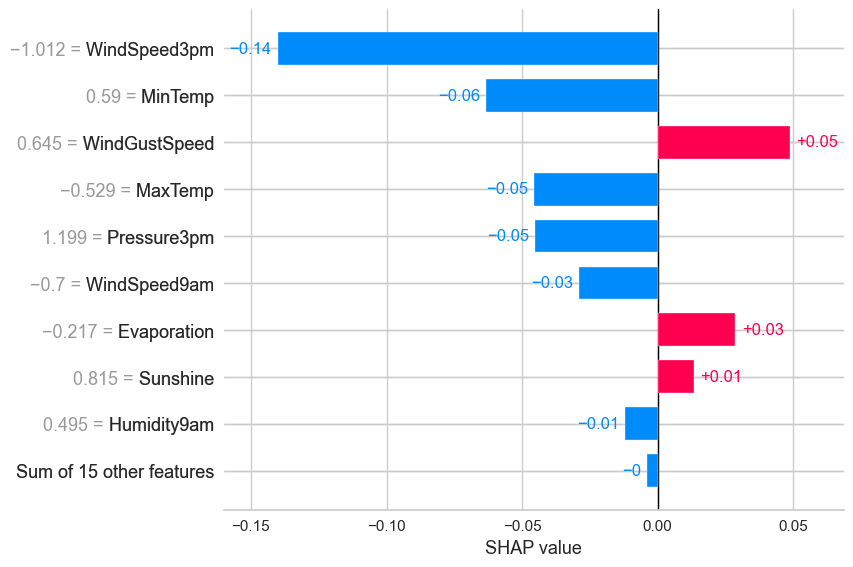

In [185]:
shap.plots.bar(shap_values[0])
plt.show()

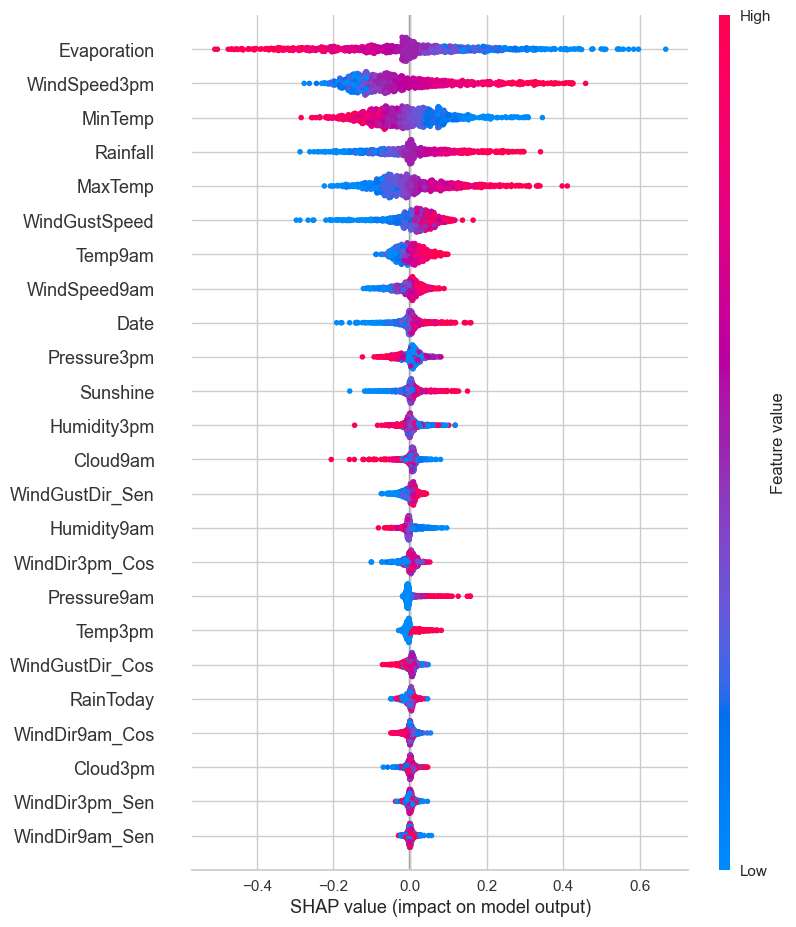

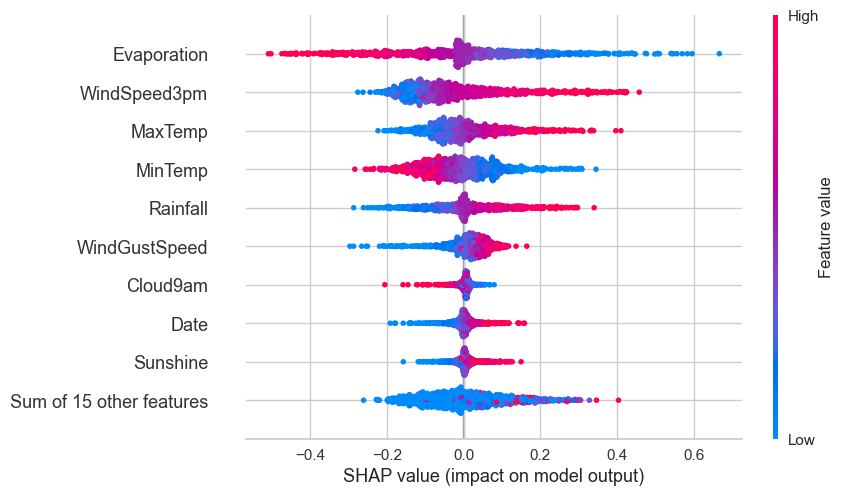

In [186]:
shap.plots.beeswarm(shap_values, max_display=30) #order=shap_values.abs.mean(0) es el defecto
plt.show()

# Ordenar por el valos abs max, nos permite ver caracteristicas con alto impacto para individuos
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0)) 
plt.show()

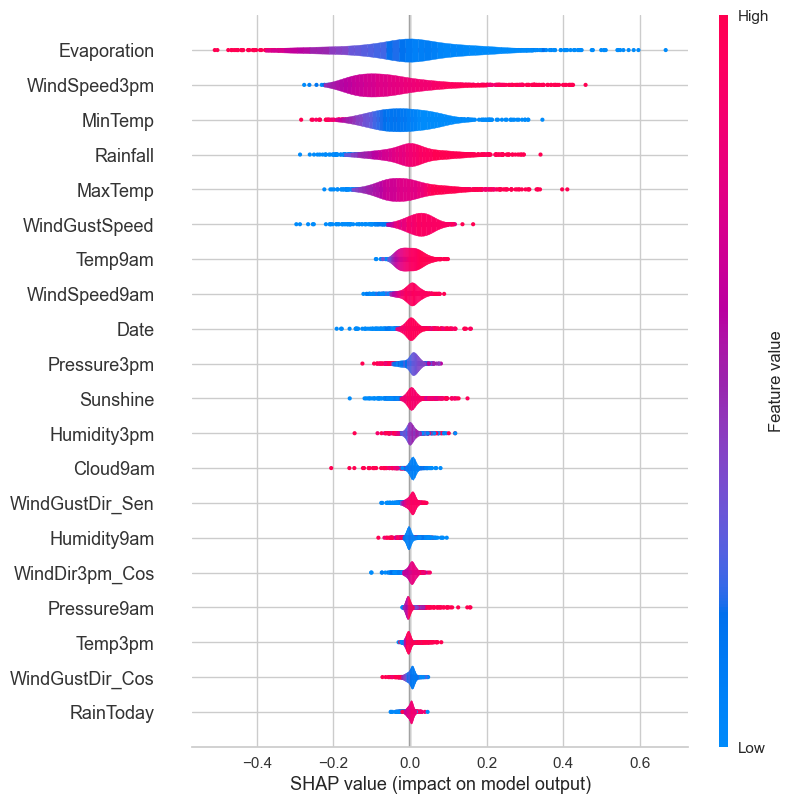

In [187]:
shap.plots.violin(shap_values)

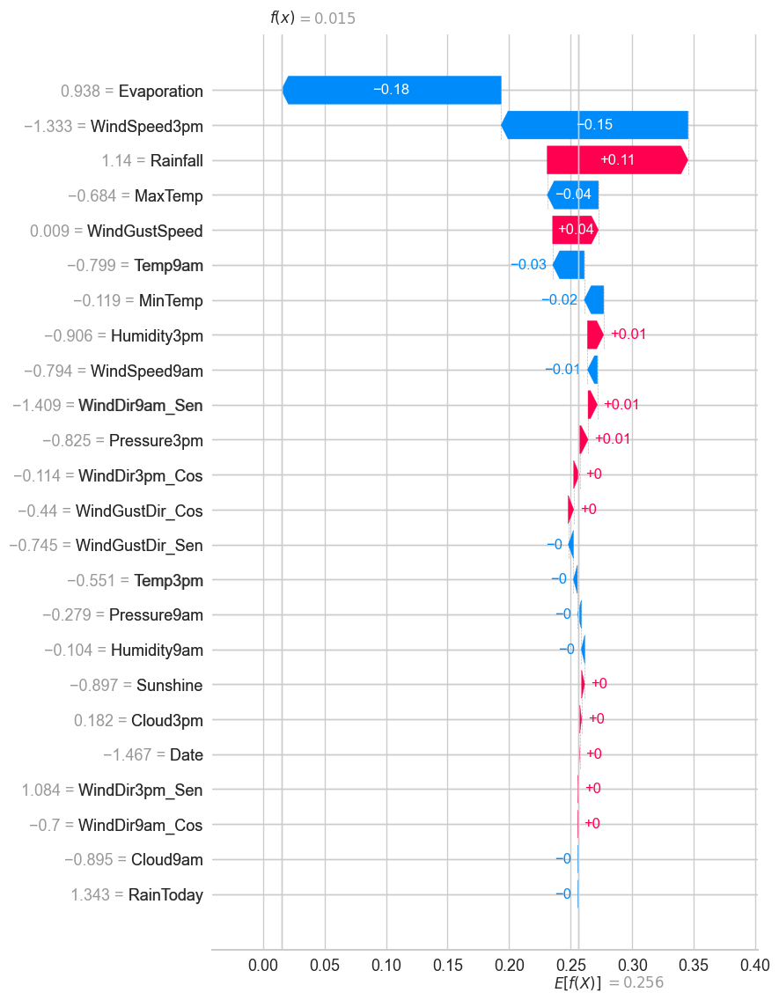

In [188]:
shap.plots.waterfall(shap_values[5], max_display=30)
plt.show()

PermutationExplainer explainer: 5618it [02:03, 42.17it/s]                          


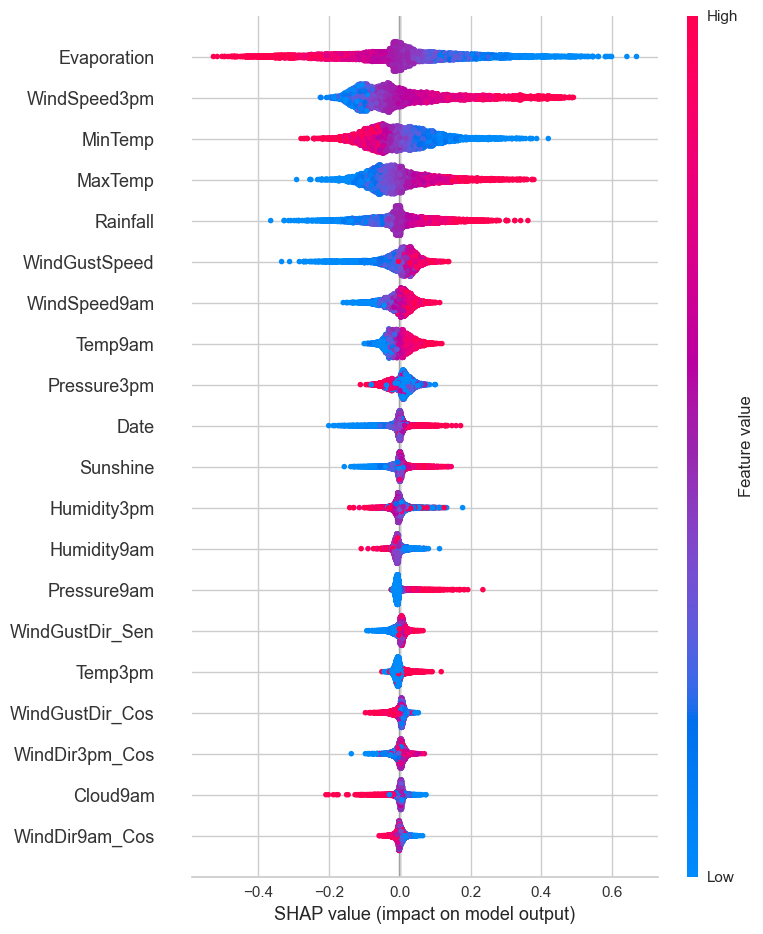

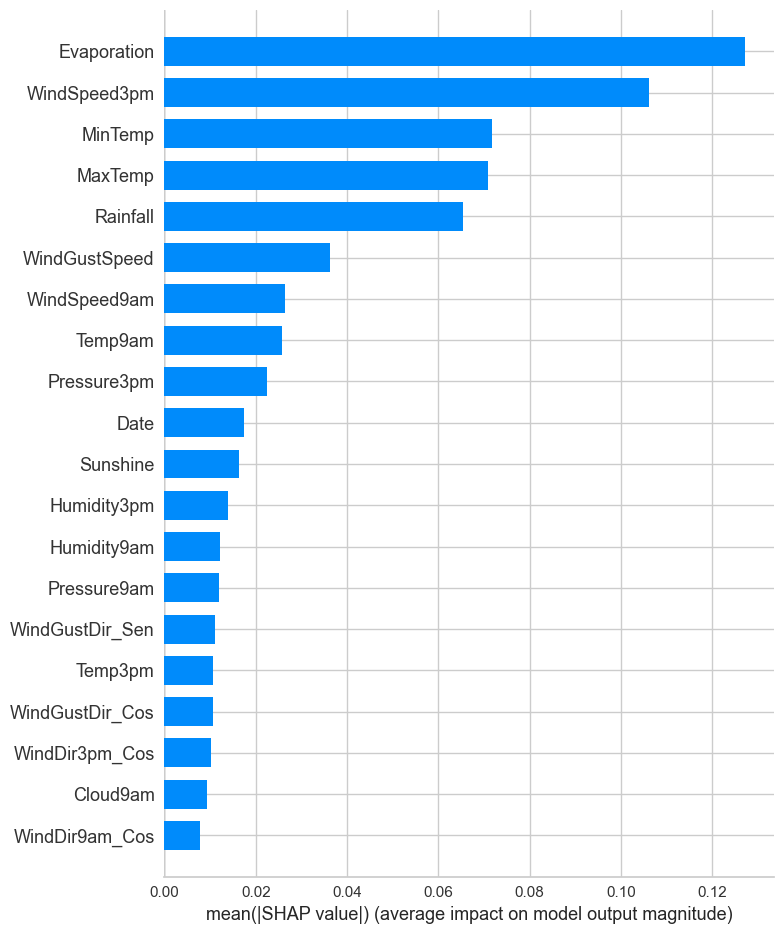

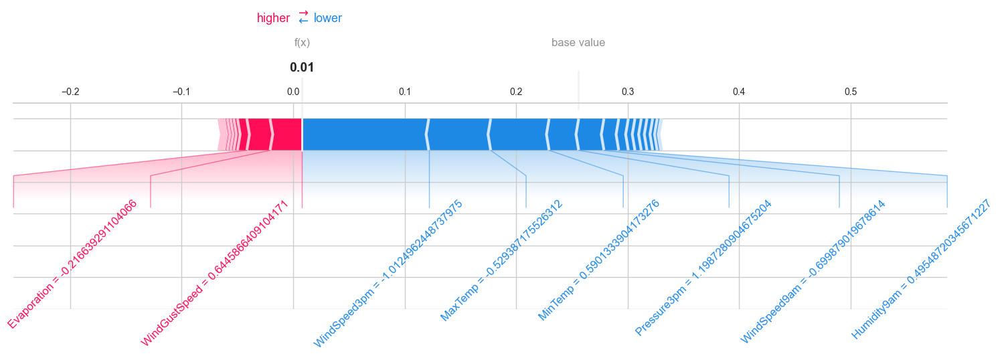

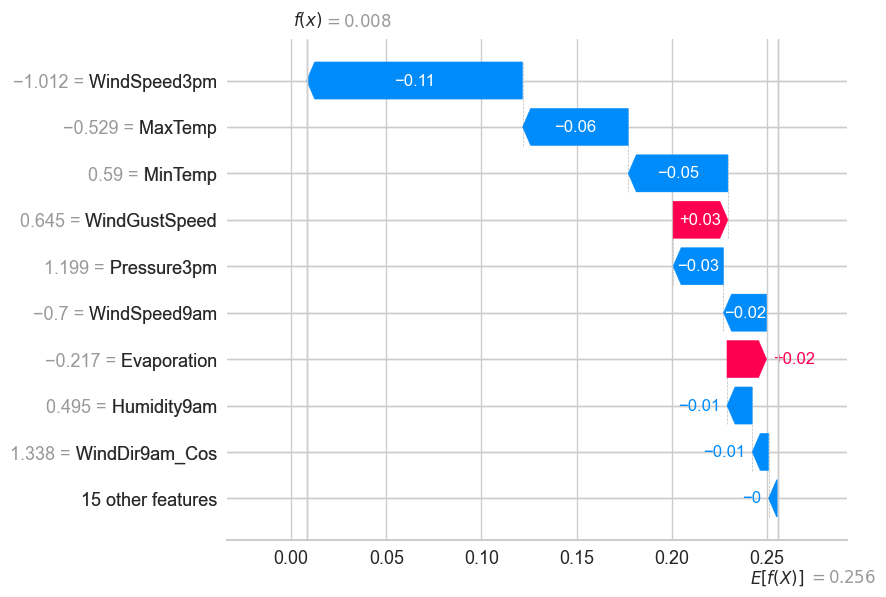

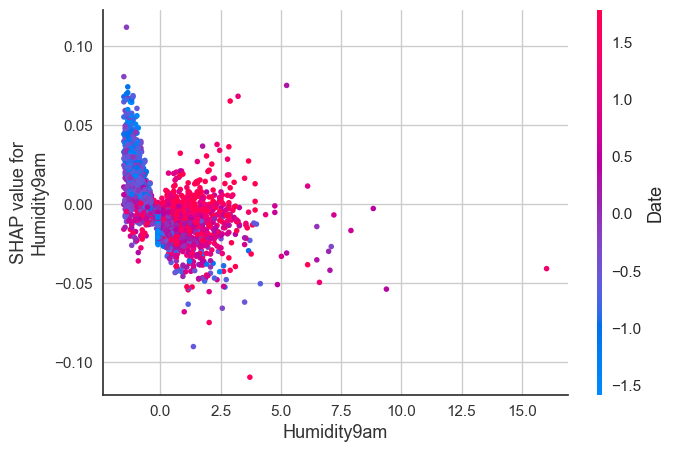

In [189]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(MODELO_RN, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

PermutationExplainer explainer: 5618it [01:45, 48.84it/s]                          


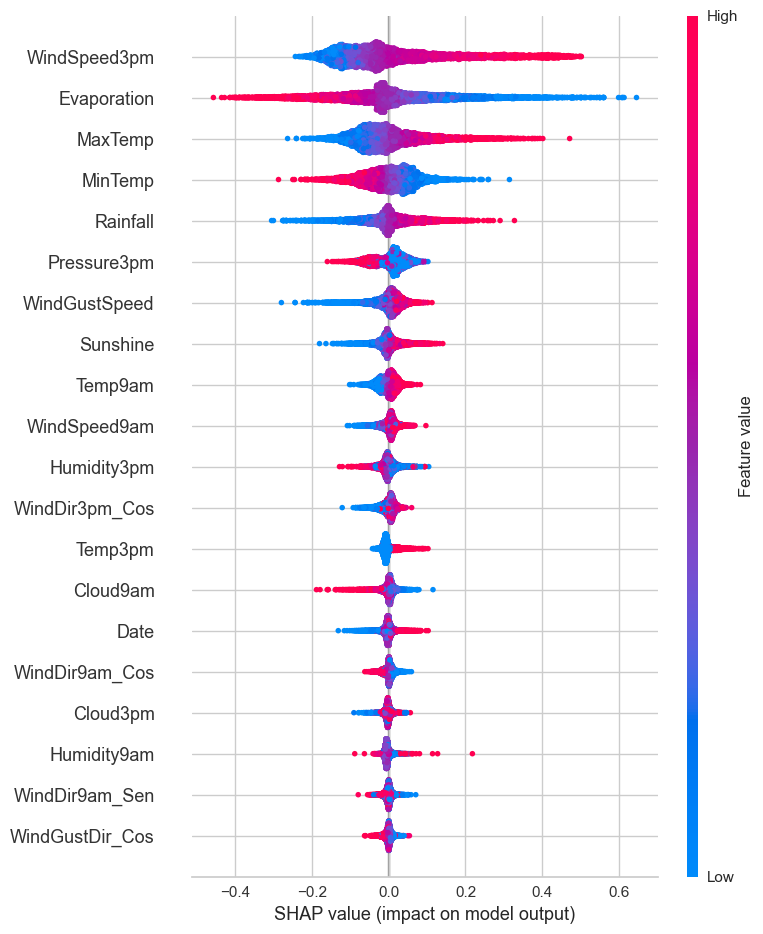

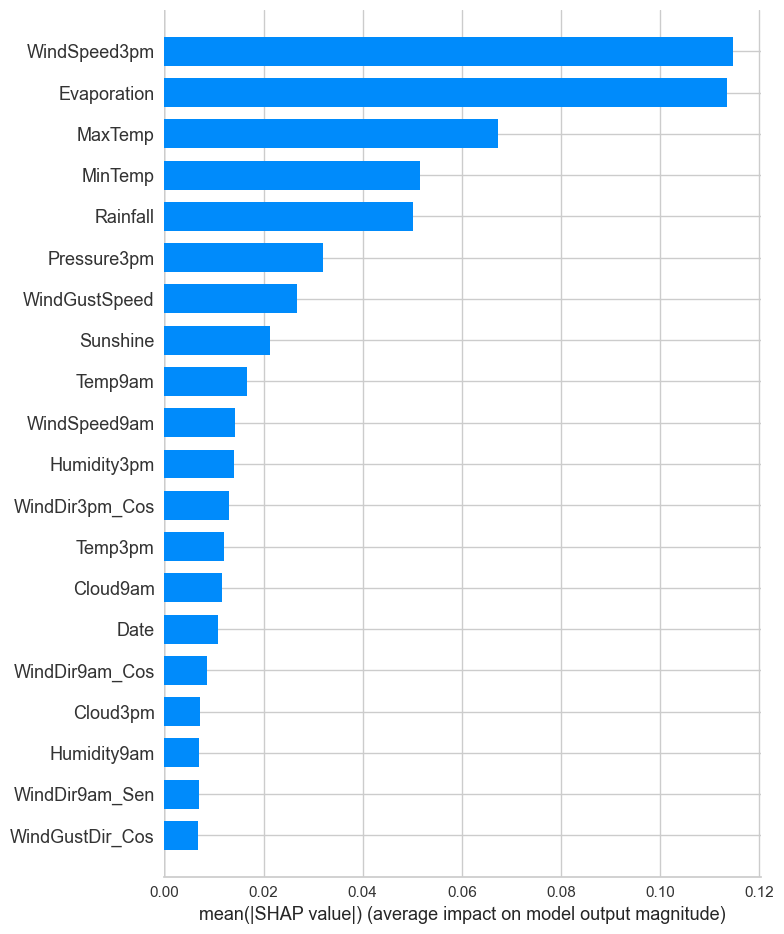

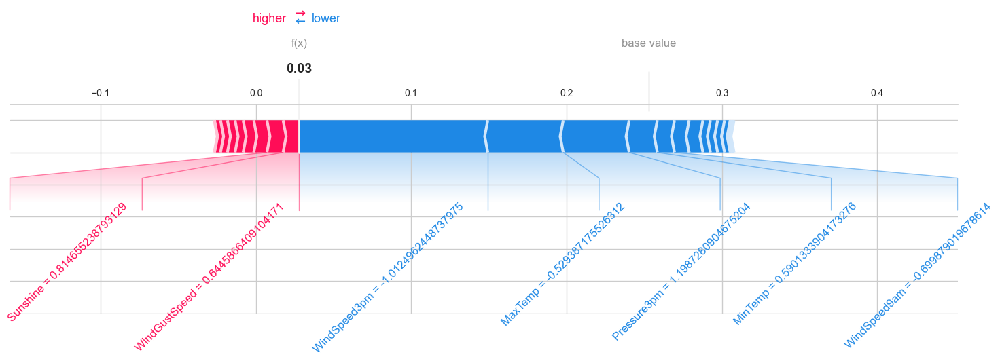

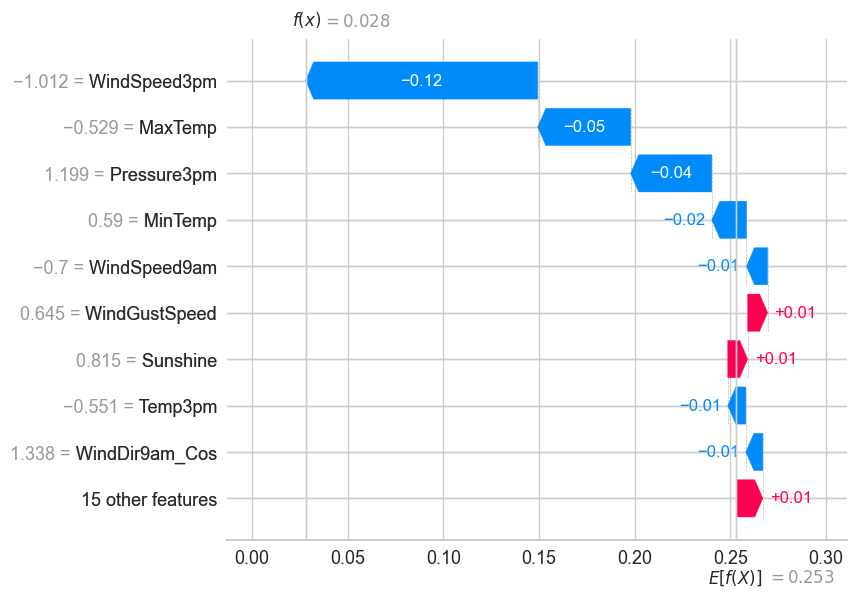

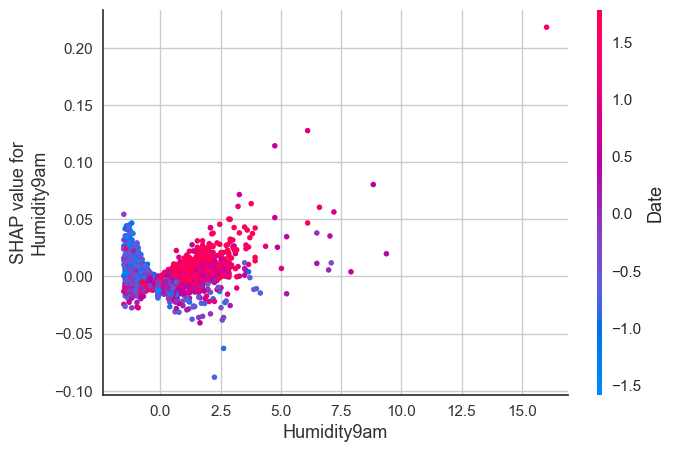

In [190]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(MODELO_RN_OPTIMIZADO, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico local: Dependence Plot
variable = "Humidity9am"  
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

## RESUMEN EJERCICIO 7:

- Se realizaron dos modelos de redes neuronales
- El primer modelo no fue optimizado
- El segundo modelo fue optimizado por busqueda bayesiana
- El modelo optimizado fue superador a cualquier modelo que se utilizo previamente, por esto se eligio a este como el modelo que se utilizara para la inferencia.

# EJERCICIO 8

In [191]:
def Metricas(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)
    
    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")


    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_estimator(modelo, X_test_scaled, y_test, cmap='Blues')
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()

In [192]:
def Metricas_RN(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)

    # Convertir las probabilidades en clases binarias (0 o 1)
    y_pred = np.where(y_pred < 0.5, 0, 1)

    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")

    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')  # Usa from_predictions en lugar de from_estimator
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()

Modelo DummyClassifier(constant=None, random_state=42, strategy='most_frequent') - Accuracy: 0.7659
Modelo DummyClassifier(constant=None, random_state=42, strategy='most_frequent') - Precision: 0.0000
Modelo DummyClassifier(constant=None, random_state=42, strategy='most_frequent') - Recall: 0.0000
Modelo DummyClassifier(constant=None, random_state=42, strategy='most_frequent') - F1-Score: 0.0000
Modelo DummyClassifier(constant=None, random_state=42, strategy='most_frequent') - ROC-AUC: 0.5000
#######
f1-score  0.0
#######


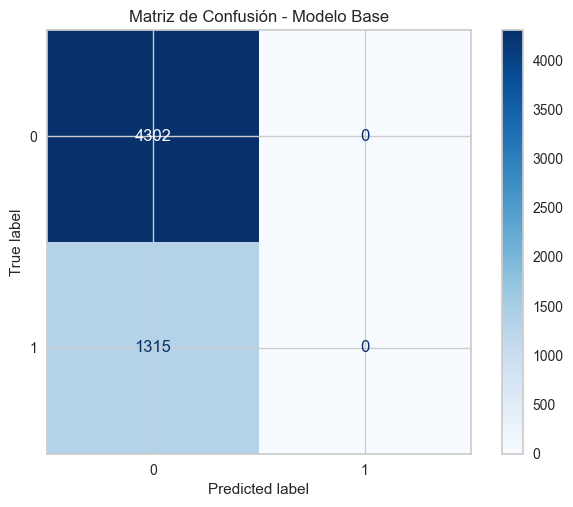

Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Accuracy: 0.8403
Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Precision: 0.7228
Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
  

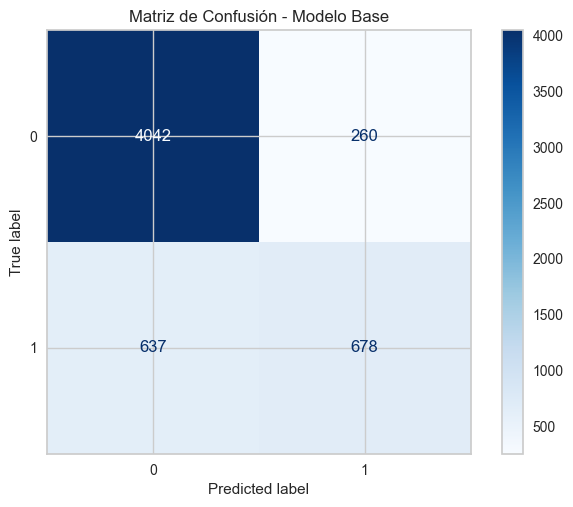

Modelo LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Accuracy: 0.7933
Modelo LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Precision: 0.5402
Modelo LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0

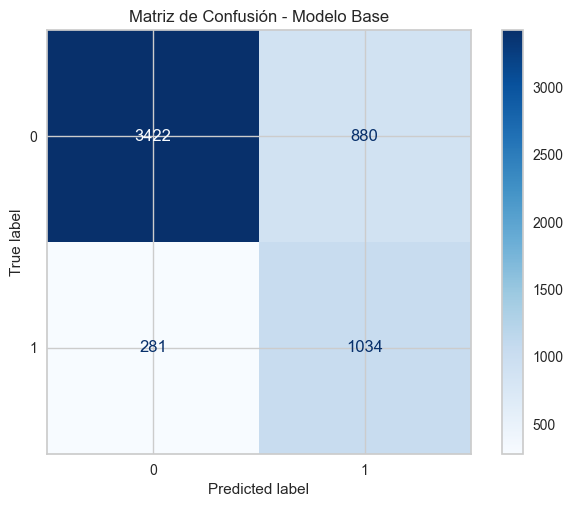

Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Accuracy: 0.7938
Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) - Precision: 0.5411
Modelo LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
  

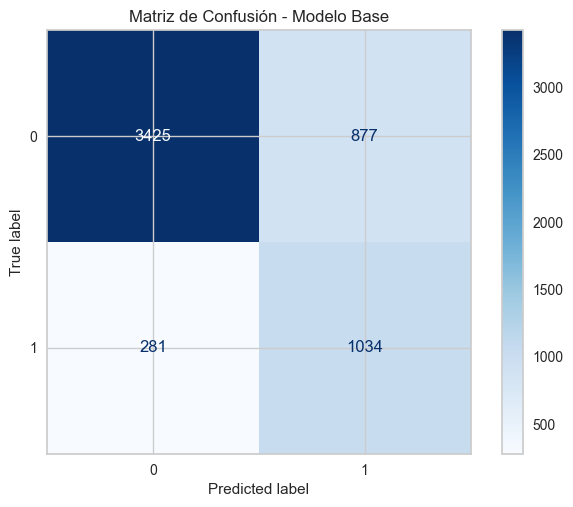

176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step
Modelo <Sequential name=sequential, built=True> - Accuracy: 0.8417
Modelo <Sequential name=sequential, built=True> - Precision: 0.6843
Modelo <Sequential name=sequential, built=True> - Recall: 0.6015
Modelo <Sequential name=sequential, built=True> - F1-Score: 0.6402
Modelo <Sequential name=sequential, built=True> - ROC-AUC: 0.7583
#######
f1-score  0.6402
#######


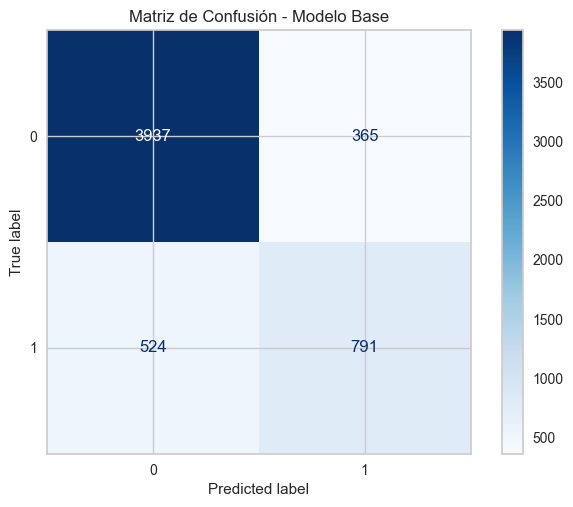

176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step
Modelo <Sequential name=sequential_51, built=True> - Accuracy: 0.8448
Modelo <Sequential name=sequential_51, built=True> - Precision: 0.7053
Modelo <Sequential name=sequential_51, built=True> - Recall: 0.5787
Modelo <Sequential name=sequential_51, built=True> - F1-Score: 0.6358
Modelo <Sequential name=sequential_51, built=True> - ROC-AUC: 0.7524
#######
f1-score  0.6358
#######


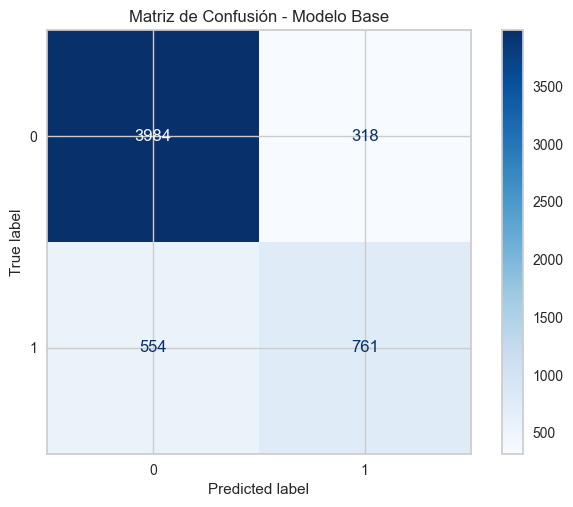

In [193]:
Metricas(dummy_clf,)
Metricas(log_reg)
Metricas(log_reg_balanced)
Metricas(log_reg_smote)
Metricas_RN(MODELO_RN)
Metricas_RN(MODELO_RN_OPTIMIZADO)


## RESUMEN EJERCICIO 8:

- Se obtuvieron las metricas de los distintos modelos
- Analizando el F1-SCORE por ser una gran metrica para dataset desbalanceados, vemos que el MODELO DE RED NEURONAL OPTIMIZADO ES EL MEJOR.

# EJERCICIO 9

In [194]:
# Guardar el modelo optimizado
MODELO_RN_OPTIMIZADO.save('docker/modelo_nn.h5')


## RESUMEN EJERCICIO 9:

- Se guardo el modelo de Redes neuronales
- El pipeline correspondiente a la imputacion y escalado de datos se realizo antes y se guardo con anterioridad. 

# EJERCICIO 10

Conclusiones finales:

Variables y Datos Faltantes: Se identificaron muchas variables categóricas y numéricas, con una cantidad significativa de datos faltantes en varias columnas. Se transformaron las variables categóricas a numéricas y se completaron los datos faltantes.

Desbalance de Datos: El conjunto de datos está desbalanceado, con muchos más días sin lluvia que con lluvia. Esto afecta el modelo, que tiende a predecir más días sin lluvia. Se sugiere realizar submuestreo o sobremuestreo para balancear el conjunto de datos.

Relaciones entre Variables: La mayoría de las variables no muestran una relación clara, excepto algunas como Temp9am, Temp3pm, MinTemp y MaxTemp, que tienen una relación lineal positiva.

Métricas del Modelo:

Accuracy no se consideró debido al desbalance de datos.

Precisión: 71.52%, indicando una buena probabilidad de que no llueva cuando el modelo predice lluvia.

Recall: 48.87%, sugiriendo que el modelo no detecta bien los días de lluvia.

F1 Score: 0.5806, mostrando un equilibrio entre precisión y recall.

Exactitud Balanceada: 72.09%, indicando un rendimiento razonable pero mejorable en la detección de lluvia.

Especificidad: 95.31%, excelente para predecir días sin lluvia, pero sugiere un sesgo hacia la predicción de "no lluvia".

Optimización de Hiperparámetros: Se utilizaron varios métodos de optimización, con Optuna proporcionando el mejor resultado en términos de Accuracy y F1 Score.

Explicabilidad del Modelo: Se utilizó SHAP para explicar el modelo, identificando que variables como Humidity9am y Sunshine tienen un impacto significativo en las predicciones.

Consideraciones Adicionales
Aunque se utilizó el F1-SCORE como métrica principal, dependiendo del objetivo final del predictor, podría ponderarse otra métrica. Por ejemplo, si queremos saber si se puede hacer un evento al aire libre, es más importante reducir la posibilidad de predecir que no llueve y que llueva, aunque esto aumente las predicciones de que llueve y no llueva. En este caso, el error más perjudicial sería predecir que no llueve y que llueva, ya que esto afectaría negativamente la planificación del evento.

Comparación de Modelos
En el análisis del archivo, se evaluaron varios modelos de aprendizaje automático, incluyendo redes neuronales y otros enfoques como la regresión logística y el Light Gradient Boosting Machine. Aquí tienes un resumen de los resultados:

Light Gradient Boosting Machine:
Accuracy: 0.8697
F1 Score: 0.6164
Tiempo de Ejecución: 3.8 segundos

Modelos de Redes Neuronales:
Modelo Básico:
F1 Score: 0.6223

Modelo Optimizado con Bayesiana:
F1 Score: 0.6131

(ES IMPORTANTE RECALCAR QUE EL MODELO BÁSICO, TIENE HIPERPARAMETROS COLOCADOS DESPUÉS DE HABER REALIZADO UNA OPTIMIZACIÓN BAYESIANA, ES POR ESO QUE ESTE VALOR COMPITE CON EL OPTIMIZADO)
Si aumentamos los n_calls en la optimización bayesiana, esto implica mayor tiempo pero obtendremos siempre valores más altos de F1 Score, se puede ver como el modelo básico obtiene valores más altos que LGBM, las optimizacion bayesiana nos da como resultados F1 SCOREs mayores a 0.6 con seguridad en este dataset.

Otros Modelos:

Regresión Logística:
F1 Score: 0.5806

Regresión Logística con Oversampling:
F1 Score: 0.5973

Grid Search:
F1 Score: 0.5986

Random Search:
F1 Score: 0.5990

Creemos que el mejor método es una red neuronal, ya que obtuvimos resultados considerablemente buenos, haciendo una optimización pequeña incluso. Y con un modelo de pocas capas, incluso se podría optimizar más de manera bayesiana probando el agregado de capas nuevas, sin embargo esto acompleja el modelo y no es nuestro objetivo. 